# Regresión lineal ventas de vivienda

In [1]:
import pandas as pd
import numpy as np
pd.set_option("display.max_rows", None, "display.max_columns", None)

In [2]:
# Configuración warnings
import warnings
warnings.filterwarnings('ignore')

In [3]:
# Cargar las funciones
exec(open(r'C:\Users\Usuario\Documents\CIENCIA DE DATOS\REPOSITORIO GITHUB\MINERÍA DE DATOS Y MODELACIÓN ejercicios\2. Ejercicio base datos vivienda\NuestrasFunciones.py').read())

In [4]:
# Leer datos depurados
viviendasDep = pd.read_csv(r'C:\Users\Usuario\Documents\CIENCIA DE DATOS\REPOSITORIO GITHUB\MINERÍA DE DATOS Y MODELACIÓN ejercicios\2. Ejercicio base datos vivienda\script_base_vivienda_reg_lin\DatosViviendasDep_wins_itImp_moda.csv', index_col=0)

# Descriptivo de comprobación
viviendasDep.head()

,month,bedrooms,bathrooms,sqft_living,sqft_lot,sqft_above,yr_built,lat,long,bedrooms_cont,log_sqft_lot,prop_missings,year,floors,waterfront,view,condition,basement,yr_renovated,bedrooms_cat,price,Luxury
0,7.0,3.0,2.5,2070.0,13386.949854,1540.0,1980.0,47.5936,-122.013,3.0,9.182077,10.526316,2014,1.0,0,0,CD,1,0,3,653450,1
1,6.0,2.0,1.5,1640.0,12756.992143,1540.0,1916.0,47.6624,-122.325,2.0,9.042871,10.526316,2014,1.5,0,0,A,1,0,2,710000,1
2,10.0,4.0,3.5,3720.0,29172.702474,3720.0,2007.0,47.3216,-121.940,4.0,9.993406,10.526316,2014,1.0,0,1,B,0,0,4,780000,1
3,12.0,3.0,3.5,2260.0,15707.597076,1880.0,2003.0,47.6422,-122.361,3.0,8.386471,10.526316,2014,2.0,0,0,B,1,0,3,795000,1
4,10.0,3.0,2.0,2050.0,11165.954458,1170.0,1960.0,47.7447,-122.328,3.0,8.718566,10.526316,2014,1.0,0,0,A,1,0,3,399950,0


In [5]:
viviendasDep.yr_renovated.value_counts()
#from NuestrasFunciones import

yr_renovated
0    4784
1     216
Name: count, dtype: int64

In [6]:
# Descripción de los variables continuas
viviendasDep.describe()

,month,bedrooms,bathrooms,sqft_living,sqft_lot,sqft_above,yr_built,lat,long,bedrooms_cont,log_sqft_lot,prop_missings,year,floors,waterfront,view,basement,yr_renovated,price,Luxury
count,5000.000000,5000.000000,5000.000000,5000.000000,5.000000e+03,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5.000000e+03,5000.000000
mean,6.589400,3.506600,2.139500,2074.678000,1.486122e+04,1782.865800,1971.084200,47.561237,-122.213939,3.504746,8.979499,0.946316,2014.316800,1.496400,0.008400,0.098200,0.391200,0.043200,5.441291e+05,0.422800
std,3.120377,2.147855,0.867606,900.212366,3.741232e+04,813.746335,29.242444,0.138218,0.140419,2.133384,0.841595,2.933870,0.465275,0.541522,0.091275,0.297615,0.488068,0.203327,3.729869e+05,0.494054
min,1.000000,0.000000,0.000000,370.000000,6.380000e+02,370.000000,1900.000000,47.155900,-122.505000,0.000000,6.458338,0.000000,2014.000000,1.000000,0.000000,0.000000,0.000000,0.000000,8.650000e+04,0.000000
25%,4.000000,3.000000,1.500000,1410.000000,5.240000e+03,1190.000000,1951.000000,47.475275,-122.330000,3.000000,8.544030,0.000000,2014.000000,1.000000,0.000000,0.000000,0.000000,0.000000,3.249375e+05,0.000000
50%,6.000000,3.000000,2.500000,1910.000000,7.948500e+03,1550.000000,1975.000000,47.574500,-122.226500,3.000000,8.943702,0.000000,2014.000000,1.500000,0.000000,0.000000,0.000000,0.000000,4.510000e+05,0.000000
75%,9.000000,4.000000,2.500000,2560.000000,1.155525e+04,2220.000000,1996.000000,47.678925,-122.124000,4.000000,9.280985,0.000000,2015.000000,2.000000,0.000000,0.000000,1.000000,0.000000,6.450000e+05,1.000000
max,12.000000,29.000000,6.000000,6550.000000,1.164794e+06,5400.000000,2015.000000,47.777000,-121.473000,28.825654,11.725695,15.789474,2015.000000,3.500000,1.000000,1.000000,1.000000,1.000000,7.062500e+06,1.000000


In [7]:
# Descripción de los variables categóricas
viviendasDep.describe(exclude=np.number)

,condition,bedrooms_cat
count,5000,5000
unique,4,7
top,B,3
freq,3254,2233


In [8]:
# Lista de columnas con menos de 10 valores distintos. Potenciales factores!
to_factor = list(viviendasDep.loc[:,viviendasDep.nunique() < 10]);  

# Cambiar el tipo de todas ellas a factor de una vez
viviendasDep[to_factor] = viviendasDep[to_factor].astype('category')

In [9]:
viviendasDep.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5000 entries, 0 to 4999
Data columns (total 22 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   month          5000 non-null   float64 
 1   bedrooms       5000 non-null   float64 
 2   bathrooms      5000 non-null   float64 
 3   sqft_living    5000 non-null   float64 
 4   sqft_lot       5000 non-null   float64 
 5   sqft_above     5000 non-null   float64 
 6   yr_built       5000 non-null   float64 
 7   lat            5000 non-null   float64 
 8   long           5000 non-null   float64 
 9   bedrooms_cont  5000 non-null   float64 
 10  log_sqft_lot   5000 non-null   float64 
 11  prop_missings  5000 non-null   category
 12  year           5000 non-null   category
 13  floors         5000 non-null   category
 14  waterfront     5000 non-null   category
 15  view           5000 non-null   category
 16  condition      5000 non-null   category
 17  basement       5000 non-null   categor

In [10]:
viviendasDep.describe()

,month,bedrooms,bathrooms,sqft_living,sqft_lot,sqft_above,yr_built,lat,long,bedrooms_cont,log_sqft_lot,price
count,5000.000000,5000.000000,5000.000000,5000.000000,5.000000e+03,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5.000000e+03
mean,6.589400,3.506600,2.139500,2074.678000,1.486122e+04,1782.865800,1971.084200,47.561237,-122.213939,3.504746,8.979499,5.441291e+05
std,3.120377,2.147855,0.867606,900.212366,3.741232e+04,813.746335,29.242444,0.138218,0.140419,2.133384,0.841595,3.729869e+05
min,1.000000,0.000000,0.000000,370.000000,6.380000e+02,370.000000,1900.000000,47.155900,-122.505000,0.000000,6.458338,8.650000e+04
25%,4.000000,3.000000,1.500000,1410.000000,5.240000e+03,1190.000000,1951.000000,47.475275,-122.330000,3.000000,8.544030,3.249375e+05
50%,6.000000,3.000000,2.500000,1910.000000,7.948500e+03,1550.000000,1975.000000,47.574500,-122.226500,3.000000,8.943702,4.510000e+05
75%,9.000000,4.000000,2.500000,2560.000000,1.155525e+04,2220.000000,1996.000000,47.678925,-122.124000,4.000000,9.280985,6.450000e+05
max,12.000000,29.000000,6.000000,6550.000000,1.164794e+06,5400.000000,2015.000000,47.777000,-121.473000,28.825654,11.725695,7.062500e+06


## Estudio descriptivo de relaciones con la respuesta

En este apartado intentaremos descubrir a priori las relaciones marginales de las variables con la variable objetivo para hacernos una idea de cuales de ellas serán potencialmente influyentes en los modelos de regresión que ajustemos. 


In [11]:
# Crear log_price
viviendasDep['log_price'] = np.log(viviendasDep.price)

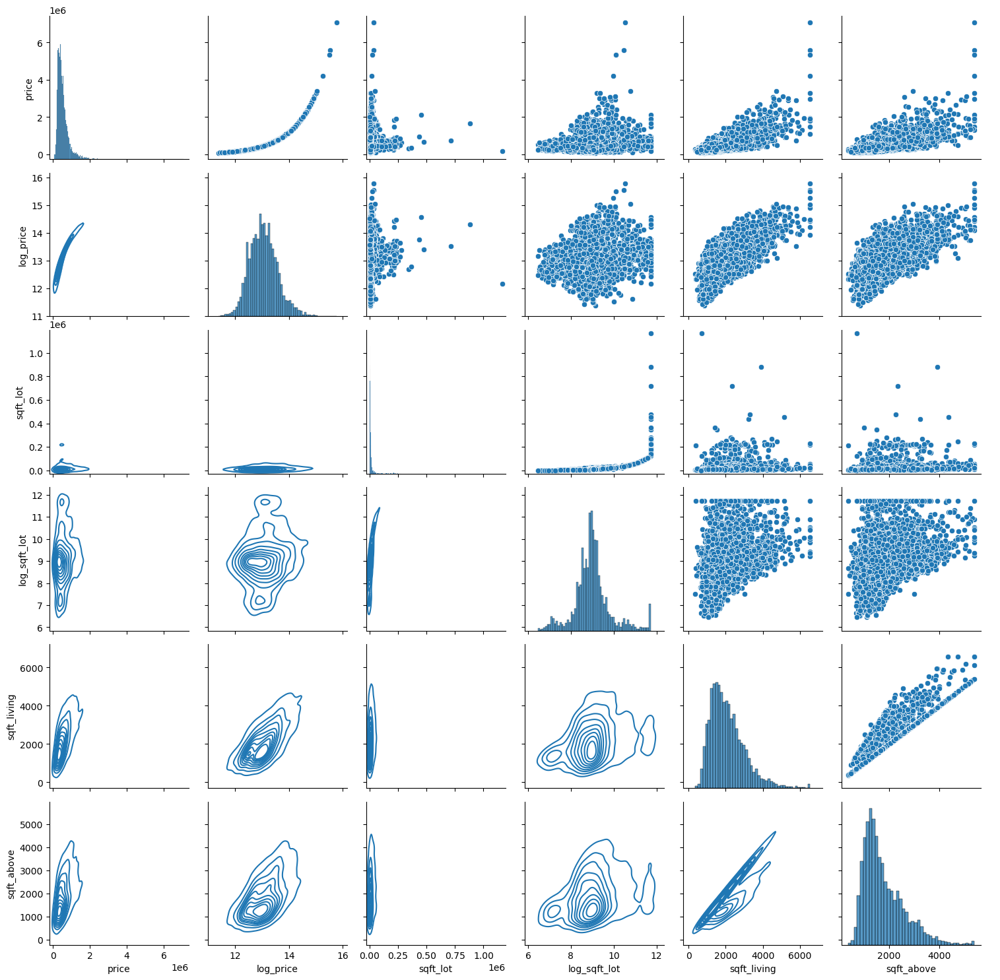

In [12]:
# Inspección gráfica
import seaborn as sns
 
g = sns.PairGrid(viviendasDep[['price','log_price','sqft_lot','log_sqft_lot','sqft_living','sqft_above']])
g.map_diag(sns.histplot)
g.map_lower(sns.kdeplot)
g.map_upper(sns.scatterplot)
g.add_legend()

plt.show()

Es claro que el logaritmo linealiza la relación con las superficies. Por otra parte, se observa que la superficie que mayor relación lineal parece presentar con la transformada de la variable objetivo es *sqft_living* aunque es cierto que *sqft_above* tiene tambié clara relación, además entre ellas existe gran correlación lo que supone un peligro de colinealidad en el modelo

**Variables de control**

In [13]:
# Crear las variables aleatorio y aleatorio2
viviendasDep['aleatorio'] = np.random.uniform(0,1,size=viviendasDep.shape[0])
viviendasDep['aleatorio2'] = np.random.uniform(0,1,size=viviendasDep.shape[0])
viviendasDep.head()

,month,bedrooms,bathrooms,sqft_living,sqft_lot,sqft_above,yr_built,lat,long,bedrooms_cont,log_sqft_lot,prop_missings,year,floors,waterfront,view,condition,basement,yr_renovated,bedrooms_cat,price,Luxury,log_price,aleatorio,aleatorio2
0,7.0,3.0,2.5,2070.0,13386.949854,1540.0,1980.0,47.5936,-122.013,3.0,9.182077,10.526316,2014,1.0,0,0,CD,1,0,3,653450,1,13.390021,0.442580,0.935654
1,6.0,2.0,1.5,1640.0,12756.992143,1540.0,1916.0,47.6624,-122.325,2.0,9.042871,10.526316,2014,1.5,0,0,A,1,0,2,710000,1,13.473020,0.079641,0.536079
2,10.0,4.0,3.5,3720.0,29172.702474,3720.0,2007.0,47.3216,-121.940,4.0,9.993406,10.526316,2014,1.0,0,1,B,0,0,4,780000,1,13.567049,0.653539,0.354567
3,12.0,3.0,3.5,2260.0,15707.597076,1880.0,2003.0,47.6422,-122.361,3.0,8.386471,10.526316,2014,2.0,0,0,B,1,0,3,795000,1,13.586097,0.350452,0.867330
4,10.0,3.0,2.0,2050.0,11165.954458,1170.0,1960.0,47.7447,-122.328,3.0,8.718566,10.526316,2014,1.0,0,0,A,1,0,3,399950,0,12.899095,0.708922,0.163456


**Función para obetener un reporte descriptivo del archivo completo** que evalúa a nivel univariante y bivariante las variables. También da información sobre valores extremos y missings, por lo que se podría utilizar en etapa de depuración

In [14]:
# pip install pandas_profiling
import pandas_profiling
pandas_profiling.ProfileReport(viviendasDep)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [15]:
# Sacar las variables objetivo continuas price y log_price
varObjCont = viviendasDep.price
varObjCont_log = viviendasDep.log_price
imput = viviendasDep.drop(['price','log_price','Luxury'],axis=1)
varObjCont.info()

<class 'pandas.core.series.Series'>
Index: 5000 entries, 0 to 4999
Series name: price
Non-Null Count  Dtype
--------------  -----
5000 non-null   int64
dtypes: int64(1)
memory usage: 207.2 KB


In [16]:
varObjCont_log.info()

<class 'pandas.core.series.Series'>
Index: 5000 entries, 0 to 4999
Series name: log_price
Non-Null Count  Dtype  
--------------  -----  
5000 non-null   float64
dtypes: float64(1)
memory usage: 207.2 KB


Definir algunas funciones que faciliten el proceso de búsqueda, automatizando lo más posible para que luego sea aplicar y evaluar

In [17]:
# Generar función cremers_v para ver asociación de variables
# Aplicar la función al input completo contra la objetivo (varObjCont)
tablaCramer = pd.DataFrame(imput.apply(lambda x: cramers_v(x,varObjCont)),columns=['VCramer'])
tablaCramer

,VCramer
month,0.031027
bedrooms,0.061915
bathrooms,0.269188
sqft_living,0.331237
sqft_lot,0.032736
sqft_above,0.251175
yr_built,0.052179
lat,0.078168
long,0.048751
bedrooms_cont,0.061915


In [18]:
# plt.clf()
# Obtener el gráfico de importancia de las variables frente a la objetivo continua según vcramer
import plotly.express as px
px.bar(tablaCramer,x=tablaCramer.VCramer,title='Relaciones frente al precio',height=600).update_yaxes(categoryorder="total ascending")
# plt.show()

In [19]:
# Reordenar categorías en bedrooms_cat
viviendasDep['bedrooms_cat']=viviendasDep.bedrooms_cat.cat.reorder_categories(['<2','2','3','4','5','6','>6'])

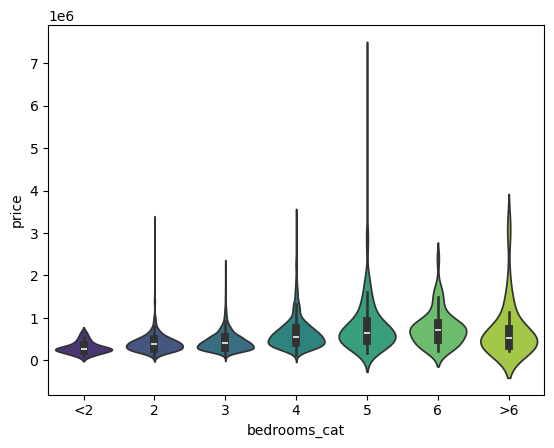

In [20]:
plt.clf()
sns.violinplot(x=viviendasDep.bedrooms_cat,y=(viviendasDep.price),palette='viridis')
plt.show()

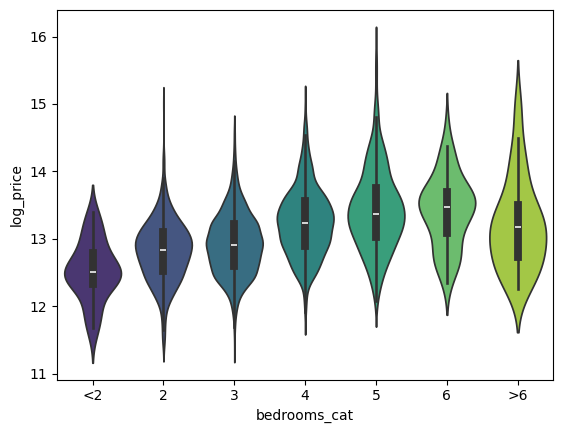

In [21]:
plt.clf()
sns.violinplot(x=viviendasDep.bedrooms_cat,y=(viviendasDep.log_price),palette='viridis')
plt.show()

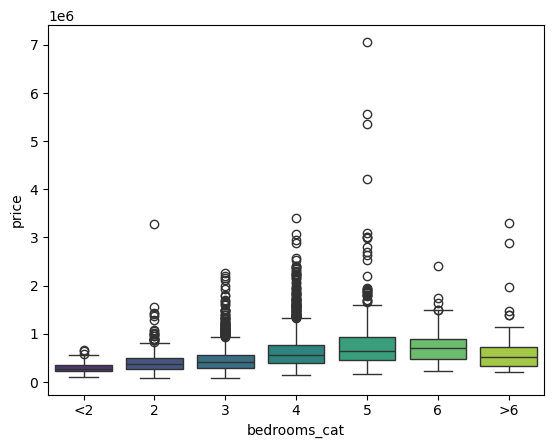

In [22]:
plt.clf()
sns.boxplot(x='bedrooms_cat',y='price',data=viviendasDep,palette='viridis')
plt.show()

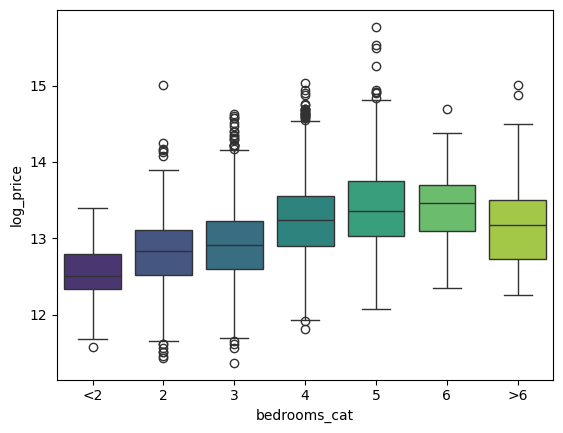

In [23]:
plt.clf()
sns.boxplot(x='bedrooms_cat',y='log_price',data=viviendasDep,palette='viridis')
plt.show()

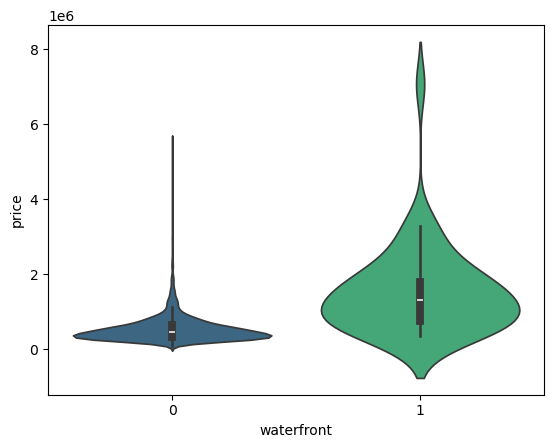

In [24]:
plt.clf()
sns.violinplot(x='waterfront',y='price',data=viviendasDep,palette='viridis')
plt.show()

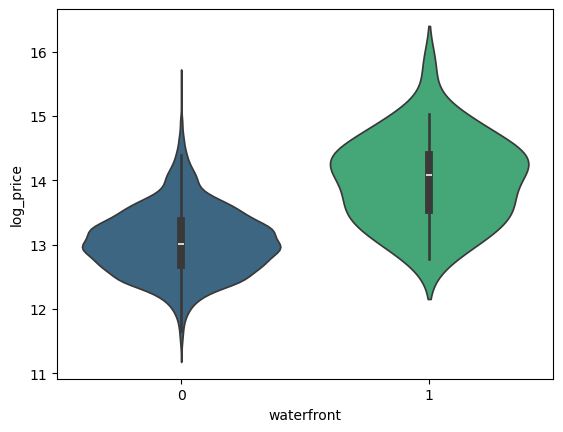

In [25]:
plt.clf()
sns.violinplot(x='waterfront',y='log_price',data=viviendasDep,palette='viridis')
plt.show()

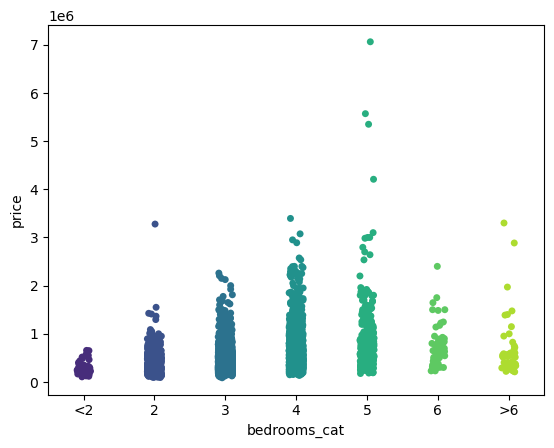

In [26]:
plt.clf()
sns.stripplot(x='bedrooms_cat',y='price',data=viviendasDep,palette='viridis')
plt.show()

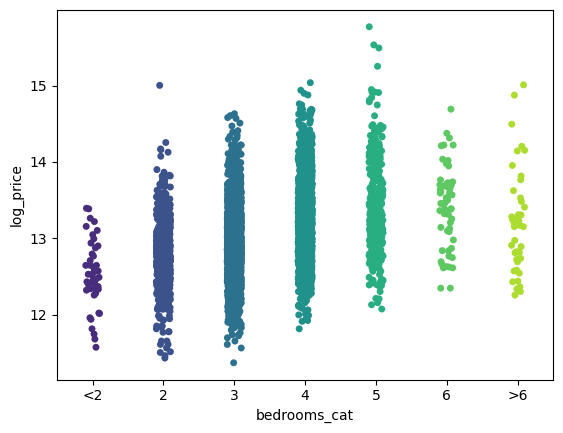

In [27]:
plt.clf()
sns.stripplot(x='bedrooms_cat',y='log_price',data=viviendasDep,palette='viridis')
plt.show()

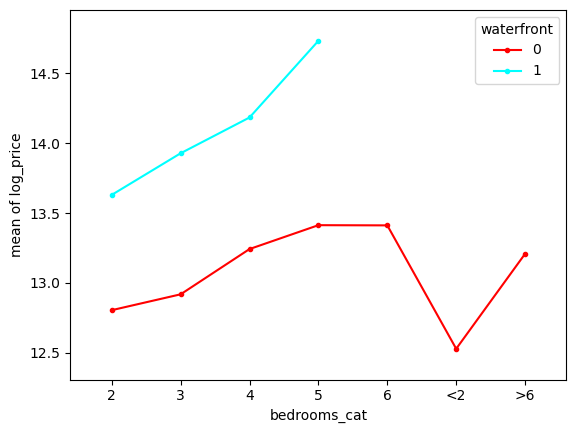

In [28]:
from statsmodels.graphics.factorplots import interaction_plot
import matplotlib.pyplot as plt

# Gráfico de interacción de las componentes del ANOVA
fig = interaction_plot(x=viviendasDep.bedrooms_cat.astype('object'), trace=viviendasDep['waterfront'].astype('object'), response=viviendasDep['log_price'])
plt.show()
# Se evidencia interacción entre los factores por la divergencia de la dinámica de precio a lo largo de las habitaciones para waterfront 0 y 1

In [29]:
# Matriz de correlaciones 
corr = viviendasDep.select_dtypes(include=np.number).corr()
corr.style.background_gradient(cmap='coolwarm').format(precision=3)
#sns.heatmap(corr, annot=True)

,month,bedrooms,bathrooms,sqft_living,sqft_lot,sqft_above,yr_built,lat,long,bedrooms_cont,log_sqft_lot,price,log_price,aleatorio,aleatorio2
month,1.000,0.011,0.032,0.024,-0.000,0.018,0.011,0.019,-0.015,0.011,-0.001,-0.015,-0.016,-0.011,0.021
bedrooms,0.011,1.000,0.205,0.263,0.002,0.226,0.103,-0.009,0.052,1.000,0.072,0.137,0.151,-0.006,-0.014
bathrooms,0.032,0.205,1.000,0.684,0.068,0.613,0.441,0.045,0.187,0.205,0.093,0.488,0.524,0.010,-0.004
sqft_living,0.024,0.263,0.684,1.000,0.155,0.876,0.311,0.063,0.229,0.264,0.343,0.696,0.707,-0.004,-0.019
sqft_lot,-0.000,0.002,0.068,0.155,1.000,0.168,0.049,-0.076,0.228,0.002,0.576,0.084,0.090,0.017,-0.024
sqft_above,0.018,0.226,0.613,0.876,0.168,1.000,0.419,-0.001,0.333,0.227,0.328,0.599,0.604,0.008,-0.017
yr_built,0.011,0.103,0.441,0.311,0.049,0.419,1.000,-0.154,0.396,0.104,-0.025,0.056,0.077,0.003,-0.010
lat,0.019,-0.009,0.045,0.063,-0.076,-0.001,-0.154,1.000,-0.149,-0.010,-0.158,0.301,0.442,-0.012,-0.001
long,-0.015,0.052,0.187,0.229,0.228,0.333,0.396,-0.149,1.000,0.053,0.371,0.011,0.034,0.025,-0.013
bedrooms_cont,0.011,1.000,0.205,0.264,0.002,0.227,0.104,-0.010,0.053,1.000,0.073,0.137,0.151,-0.006,-0.015


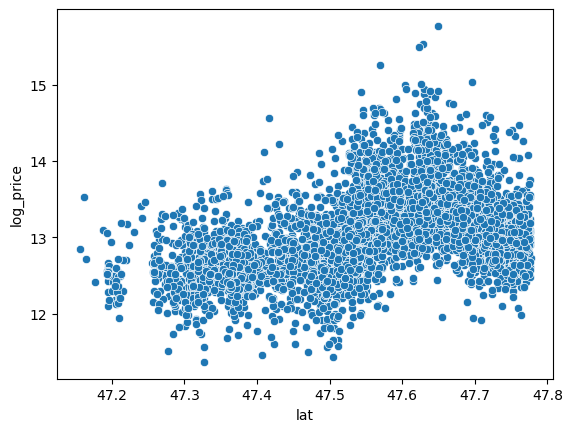

In [30]:
# Gráfico para ver relación entre lat y log_price
plt.clf()
sns.scatterplot(data=viviendasDep, x="lat", y="log_price")
#sns.boxplot(x='sqft_living',y='Luxury',data=viviendasDep,palette='viridis')
plt.show()

In [31]:
# Tramificar, hacer agrupamientos y pasarlas a categorías (binning). Las numéricas quedan en formato objeto
# http://gnpalencia.org/optbinning/binning_continuous.html
from optbinning import ContinuousOptimalBinning

optb = ContinuousOptimalBinning(name='lat', dtype="numerical", max_n_bins=2)
optb.fit(imput['lat'].values, np.log(varObjCont))

x_transform_bins = optb.transform(imput['lat'].values, metric="bins")
x_transform_bins

(CVXPY) Dec 06 06:43:00 PM: Encountered unexpected exception importing solver GLOP:
RuntimeError('Unrecognized new version of ortools (9.11.4210). Expected < 9.10.0. Please open a feature request on cvxpy to enable support for this version.')
(CVXPY) Dec 06 06:43:00 PM: Encountered unexpected exception importing solver PDLP:
RuntimeError('Unrecognized new version of ortools (9.11.4210). Expected < 9.10.0. Please open a feature request on cvxpy to enable support for this version.')


array(['[47.51, inf)', '[47.51, inf)', '(-inf, 47.51)', ...,
       '(-inf, 47.51)', '[47.51, inf)', '[47.51, inf)'], dtype=object)

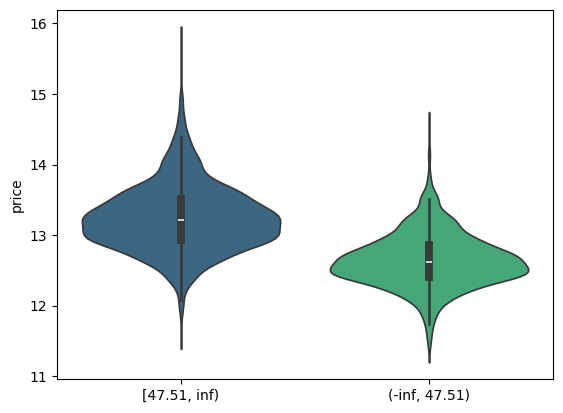

In [32]:
plt.clf()
sns.violinplot(x=x_transform_bins,y=np.log(varObjCont),palette='viridis')
plt.show()

In [33]:
# Valorar la capacidad a priori de esta variable
# Importar la api para fórmulas (en concreto ols para regresión)
from statsmodels.formula.api import ols 
from sklearn.model_selection import train_test_split

# Regresión log_price vs lat
model = ols('np.log(price) ~ lat', data=viviendasDep).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          np.log(price)   R-squared:                       0.196
Model:                            OLS   Adj. R-squared:                  0.196
Method:                 Least Squares   F-statistic:                     1216.
Date:                Fri, 06 Dec 2024   Prob (F-statistic):          1.08e-238
Time:                        18:43:07   Log-Likelihood:                -3354.7
No. Observations:                5000   AIC:                             6713.
Df Residuals:                    4998   BIC:                             6726.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    -67.2948      2.304    -29.208      0.000     -71.812     -62.778
lat            1.6894      0.048     34.874      0.000       1.594       1.784
==============================================================================
Omnibus:                      387.491   Durbin-Watson:                   2.021
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              591.262
Skew:                           0.612   Prob(JB):                    4.06e-129
Kurtosis:                       4.158   Cond. No.                     1.64e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.64e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [34]:
tr_tst_eval_lin('np.log(price) ~ lat',viviendasDep)
# El Coeficiente de determinación r2 es muy bajo

Coeficiente de determinación TRAINING:  0.19686118188120072 

Mean squared error TEST: 0.48
Coeficiente de determinación TEST: 0.19


In [35]:
# Comparar con el modelo simple con la variable lat recodificada en dos tramos
# ANOVA latitud tramificada
viviendasDep['lat_rec'] = x_transform_bins
model = ols('np.log(price) ~ C(lat_rec)', data=viviendasDep).fit() # el complemento C() fuerza a la consideración de la variable de entrada como factor
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          np.log(price)   R-squared:                       0.279
Model:                            OLS   Adj. R-squared:                  0.279
Method:                 Least Squares   F-statistic:                     1934.
Date:                Fri, 06 Dec 2024   Prob (F-statistic):               0.00
Time:                        18:43:14   Log-Likelihood:                -3081.4
No. Observations:                5000   AIC:                             6167.
Df Residuals:                    4998   BIC:                             6180.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================================
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
Intercept                     12.6411      0.011   1115.346      0.000      12.619      12.663
C(lat_rec)[T.[47.51, inf)]     0.6013      0.014     43.978      0.000       0.574       0.628
==============================================================================
Omnibus:                      374.113   Durbin-Watson:                   2.017
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              632.963
Skew:                           0.561   Prob(JB):                    3.58e-138
Kurtosis:                       4.334   Cond. No.                         3.34
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [36]:
tr_tst_eval_lin('np.log(price) ~ C(lat_rec)',viviendasDep)
# El Coeficiente de determinación r2 mejora tanto en training como en test

Coeficiente de determinación TRAINING:  0.28337589644643324 

Mean squared error TEST: 0.46
Coeficiente de determinación TEST: 0.26


## Modelos de regresión lineal para la predicción del precio de la vivienda

### Partición training-test

In [37]:
imput['lat_rec'] = x_transform_bins

# varObjCont_log = np.log(varObjCont)
# varObjCont_log.name='log_price'

# Función necesaria
from sklearn.model_selection import train_test_split

# Crear 4 objetos: predictores para tr y tst y variable objetivo para tr y tst. 
X_train, X_test, y_train, y_test = train_test_split(imput, varObjCont_log, test_size=0.2, random_state=42)

# Compror dimensiones
print('Training dataset shape:', X_train.shape, y_train.shape)
print('Testing dataset shape:', X_test.shape, y_test.shape)

Training dataset shape: (4000, 23) (4000,)
Testing dataset shape: (1000, 23) (1000,)


In [38]:
# Generar el training con la objetivo dentro 
data_train = X_train.join(y_train)

## Colinealidad de las superficies



In [39]:
# Importar la api para fórmulas (en concreto ols para regresión)
from statsmodels.formula.api import ols 

# Ajustar regresión de ejemplo
results = ols('log_price ~ sqft_living',data=data_train).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              log_price   R-squared:                       0.505
Model:                            OLS   Adj. R-squared:                  0.505
Method:                 Least Squares   F-statistic:                     4076.
Date:                Fri, 06 Dec 2024   Prob (F-statistic):               0.00
Time:                        18:43:31   Log-Likelihood:                -1748.4
No. Observations:                4000   AIC:                             3501.
Df Residuals:                    3998   BIC:                             3513.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept      12.1909      0.015    824.184      0.000      12.162      12.220
sqft_living     0.0004   6.53e-06     63.842      0.000       0.000       0.000
==============================================================================
Omnibus:                       10.933   Durbin-Watson:                   1.999
Prob(Omnibus):                  0.004   Jarque-Bera (JB):                8.790
Skew:                           0.001   Prob(JB):                       0.0123
Kurtosis:                       2.770   Cond. No.                     5.65e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.65e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [40]:
tr_tst_eval_lin('log_price ~ sqft_living',viviendasDep)

Coeficiente de determinación TRAINING:  0.4965995360913603 

Mean squared error TEST: 0.37
Coeficiente de determinación TEST: 0.51


In [41]:
# Importar la api para fórmulas (en concreto ols para regresión)
from statsmodels.formula.api import ols 

# Ajustar regresión de ejemplo
results = ols('log_price ~ sqft_above',data=data_train).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              log_price   R-squared:                       0.369
Model:                            OLS   Adj. R-squared:                  0.369
Method:                 Least Squares   F-statistic:                     2336.
Date:                Fri, 06 Dec 2024   Prob (F-statistic):               0.00
Time:                        18:43:38   Log-Likelihood:                -2233.8
No. Observations:                4000   AIC:                             4472.
Df Residuals:                    3998   BIC:                             4484.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     12.3504      0.016    768.920      0.000      12.319      12.382
sqft_above     0.0004    8.2e-06     48.330      0.000       0.000       0.000
==============================================================================
Omnibus:                       17.483   Durbin-Watson:                   1.973
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               16.710
Skew:                           0.131   Prob(JB):                     0.000235
Kurtosis:                       2.823   Cond. No.                     4.71e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 4.71e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [42]:
tr_tst_eval_lin('log_price ~ sqft_above',viviendasDep)
# Se ve que, por r2, es mejor el modelo con sqft_living que el de sqft_above

Coeficiente de determinación TRAINING:  0.358558932564226 

Mean squared error TEST: 0.42
Coeficiente de determinación TEST: 0.39


In [43]:
# Comprobar si existe efecto combinado potenciador entre estas variables. Generamos el modelo con ambos efectos 
# Importamos la api para fórmulas (en concreto ols para regresión)
from statsmodels.formula.api import ols 

# Ajusto regresión de ejemplo
results = ols('log_price ~ sqft_living+sqft_above',data=data_train).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              log_price   R-squared:                       0.506
Model:                            OLS   Adj. R-squared:                  0.506
Method:                 Least Squares   F-statistic:                     2047.
Date:                Fri, 06 Dec 2024   Prob (F-statistic):               0.00
Time:                        18:43:45   Log-Likelihood:                -1743.6
No. Observations:                4000   AIC:                             3493.
Df Residuals:                    3997   BIC:                             3512.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept      12.1976      0.015    816.804      0.000      12.168      12.227
sqft_living     0.0005   1.36e-05     33.318      0.000       0.000       0.000
sqft_above   -4.66e-05   1.51e-05     -3.079      0.002   -7.63e-05   -1.69e-05
==============================================================================
Omnibus:                        7.822   Durbin-Watson:                   2.004
Prob(Omnibus):                  0.020   Jarque-Bera (JB):                6.561
Skew:                          -0.001   Prob(JB):                       0.0376
Kurtosis:                       2.802   Cond. No.                     7.52e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 7.52e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [44]:
tr_tst_eval_lin('log_price ~ sqft_living + sqft_above',viviendasDep)
# Incluir ambos no efects no mejora el r2

Coeficiente de determinación TRAINING:  0.4978948827785793 

Mean squared error TEST: 0.37
Coeficiente de determinación TEST: 0.51


In [45]:
# Generar el modelo de interacción de variables
# Importar la api para fórmulas (en concreto ols para regresión)
from statsmodels.formula.api import ols 

# Ajustar regresión de ejemplo
results = ols('log_price ~ sqft_living*sqft_above',data=data_train).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              log_price   R-squared:                       0.506
Model:                            OLS   Adj. R-squared:                  0.506
Method:                 Least Squares   F-statistic:                     1366.
Date:                Fri, 06 Dec 2024   Prob (F-statistic):               0.00
Time:                        18:43:52   Log-Likelihood:                -1742.7
No. Observations:                4000   AIC:                             3493.
Df Residuals:                    3996   BIC:                             3519.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
Intercept                 12.1614      0.030    401.465      0.000      12.102      12.221
sqft_living                0.0005   1.72e-05     27.164      0.000       0.000       0.001
sqft_above             -2.538e-05   2.17e-05     -1.172      0.241   -6.78e-05    1.71e-05
sqft_living:sqft_above -7.302e-09   5.33e-09     -1.370      0.171   -1.77e-08    3.15e-09
==============================================================================
Omnibus:                        9.187   Durbin-Watson:                   2.006
Prob(Omnibus):                  0.010   Jarque-Bera (JB):                7.555
Skew:                           0.001   Prob(JB):                       0.0229
Kurtosis:                       2.787   Cond. No.                     3.09e+07
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.09e+07. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [46]:
tr_tst_eval_lin('log_price ~ sqft_living * sqft_above',viviendasDep)
# No hay mejora y los p-value no son significativos

Coeficiente de determinación TRAINING:  0.49792571070626634 

Mean squared error TEST: 0.37
Coeficiente de determinación TEST: 0.51


Modelo con living y lat_rec, pues son buenas variables

In [47]:
# Importar la api para fórmulas (en concreto ols para regresión)
from statsmodels.formula.api import ols 

# Ajustar regresión de ejemplo
results = ols('log_price ~ sqft_living+lat_rec',data=data_train).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              log_price   R-squared:                       0.709
Model:                            OLS   Adj. R-squared:                  0.709
Method:                 Least Squares   F-statistic:                     4871.
Date:                Fri, 06 Dec 2024   Prob (F-statistic):               0.00
Time:                        18:43:59   Log-Likelihood:                -684.57
No. Observations:                4000   AIC:                             1375.
Df Residuals:                    3997   BIC:                             1394.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
===========================================================================================
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Intercept                  11.8941      0.013    940.452      0.000      11.869      11.919
lat_rec[T.[47.51, inf)]     0.5245      0.010     52.977      0.000       0.505       0.544
sqft_living                 0.0004   5.04e-06     76.405      0.000       0.000       0.000
==============================================================================
Omnibus:                       79.926   Durbin-Watson:                   2.042
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              153.589
Skew:                           0.111   Prob(JB):                     4.45e-34
Kurtosis:                       3.934   Cond. No.                     6.92e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 6.92e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [48]:
tr_tst_eval_lin('log_price ~ sqft_living + lat_rec',viviendasDep)
# Muy buen modelo, con dos variables se recoge el 70% de variabilidad de la objetivo con buena generalización

Coeficiente de determinación TRAINING:  0.7017431450339684 

Mean squared error TEST: 0.28
Coeficiente de determinación TEST: 0.71


### Modelo completo de referencia

In [49]:
# Aplicar a fórmula de modelo completo
form=ols_formula(data_train,'log_price', 'bedrooms','lat','sqft_lot','bedrooms_cont')
form

'log_price ~ month + bathrooms + sqft_living + sqft_above + yr_built + long + log_sqft_lot + prop_missings + year + floors + waterfront + view + condition + basement + yr_renovated + bedrooms_cat + aleatorio + aleatorio2 + lat_rec'

In [50]:
# Ajustar regresión según fórmula completa
modeloC = ols(form,data=data_train).fit()
modeloC.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              log_price   R-squared:                       0.759
Model:                            OLS   Adj. R-squared:                  0.757
Method:                 Least Squares   F-statistic:                     389.6
Date:                Fri, 06 Dec 2024   Prob (F-statistic):               0.00
Time:                        18:44:09   Log-Likelihood:                -311.32
No. Observations:                4000   AIC:                             688.6
Df Residuals:                    3967   BIC:                             896.3
Df Model:                          32                                         
Covariance Type:            nonrobust                                         
=======================================================================================================
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
Intercept                              -7.5149      4.749     -1.582      0.114     -16.826       1.796
prop_missings[T.5.263157894736842]     -0.0152      0.029     -0.515      0.606      -0.073       0.043
prop_missings[T.10.526315789473683]    -0.0107      0.016     -0.666      0.506      -0.042       0.021
prop_missings[T.15.789473684210526]     0.1298      0.082      1.579      0.114      -0.031       0.291
year[T.2015]                            0.0587      0.014      4.114      0.000       0.031       0.087
floors[T.1.5]                           0.0511      0.017      3.090      0.002       0.019       0.084
floors[T.2.0]                           0.0387      0.014      2.758      0.006       0.011       0.066
floors[T.2.5]                           0.1588      0.051      3.115      0.002       0.059       0.259
floors[T.3.0]                           0.1249      0.030      4.227      0.000       0.067       0.183
floors[T.3.5]                           0.0151      0.272      0.056      0.956      -0.518       0.548
waterfront[T.1]                         0.4299      0.053      8.108      0.000       0.326       0.534
view[T.1]                               0.1975      0.016     12.739      0.000       0.167       0.228
condition[T.B]                         -0.0884      0.017     -5.301      0.000      -0.121      -0.056
condition[T.CD]                        -0.0444      0.017     -2.619      0.009      -0.078      -0.011
condition[T.Desc]                      -0.2226      0.048     -4.637      0.000      -0.317      -0.129
basement[T.1]                           0.0647      0.017      3.880      0.000       0.032       0.097
yr_renovated[T.1]                       0.0523      0.023      2.321      0.020       0.008       0.097
bedrooms_cat[T.3]                      -0.0324      0.014     -2.351      0.019      -0.060      -0.005
bedrooms_cat[T.4]                      -0.0500      0.016     -3.109      0.002      -0.082      -0.018
bedrooms_cat[T.5]                      -0.1028      0.023     -4.550      0.000      -0.147      -0.059
bedrooms_cat[T.6]                      -0.2517      0.041     -6.102      0.000      -0.333      -0.171
bedrooms_cat[T.<2]                     -0.1295      0.045     -2.871      0.004      -0.218      -0.041
bedrooms_cat[T.>6]                     -0.0467      0.058     -0.803      0.422      -0.161       0.067
lat_rec[T.[47.51, inf)]                 0.5114      0.010     51.509      0.000       0.492       0.531
month                                  -0.0014      0.002     -0.677      0.498      -0.006       0.003
bathrooms                               0.0649      0.007      8.731      0.000       0.050       0.079
sqft_living                             0.0002   1.95e-05     11.25

In [51]:
tr_tst_eval_lin(form,viviendasDep)
# Buen r2 pero muchos efectos no significativos

Coeficiente de determinación TRAINING:  0.7551365248626178 

Mean squared error TEST: 0.26
Coeficiente de determinación TEST: 0.76


### Importacia de las variables continuas

In [52]:
from relativeImp import relativeImp

# Nombres de las variables continuas
names=X_train.select_dtypes(include=np.number).columns.tolist()

# Calcular importancia relativa de las variable continuas en modelo (solo con variables continuas)
df_results = relativeImp(data_train, outcomeName = 'log_price', driverNames = names)

df_results.sort_values(by='normRelaImpt', ascending=False)

,driver,rawRelaImpt,normRelaImpt
3,sqft_living,0.213964,31.241492
7,lat,0.165872,24.219422
5,sqft_above,0.144818,21.145232
2,bathrooms,0.110216,16.092959
6,yr_built,0.013621,1.988812
10,log_sqft_lot,0.011320,1.652858
9,bedrooms_cont,0.006552,0.956658
1,bedrooms,0.006506,0.949929
8,long,0.005310,0.775289
4,sqft_lot,0.004855,0.708964


Generar de manera explícita las matrices de diseño del modelo, por el tema de las variables categóricas. 

In [53]:
# Importar paquete pasty para generar matrices de diseño
import patsy

# Generar las matrices de diseño según la fórmula de modelo completo
y, X = patsy.dmatrices(form, data_train, return_type='dataframe')

# Ahora podemos aplicar la función "oficial" de statmodels OLS (con formato y,X)
model=sm.OLS(y,X).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              log_price   R-squared:                       0.759
Model:                            OLS   Adj. R-squared:                  0.757
Method:                 Least Squares   F-statistic:                     389.6
Date:                Fri, 06 Dec 2024   Prob (F-statistic):               0.00
Time:                        18:44:21   Log-Likelihood:                -311.32
No. Observations:                4000   AIC:                             688.6
Df Residuals:                    3967   BIC:                             896.3
Df Model:                          32                                         
Covariance Type:            nonrobust                                         
=======================================================================================================
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
Intercept                              -7.5149      4.749     -1.582      0.114     -16.826       1.796
prop_missings[T.5.263157894736842]     -0.0152      0.029     -0.515      0.606      -0.073       0.043
prop_missings[T.10.526315789473683]    -0.0107      0.016     -0.666      0.506      -0.042       0.021
prop_missings[T.15.789473684210526]     0.1298      0.082      1.579      0.114      -0.031       0.291
year[T.2015]                            0.0587      0.014      4.114      0.000       0.031       0.087
floors[T.1.5]                           0.0511      0.017      3.090      0.002       0.019       0.084
floors[T.2.0]                           0.0387      0.014      2.758      0.006       0.011       0.066
floors[T.2.5]                           0.1588      0.051      3.115      0.002       0.059       0.259
floors[T.3.0]                           0.1249      0.030      4.227      0.000       0.067       0.183
floors[T.3.5]                           0.0151      0.272      0.056      0.956      -0.518       0.548
waterfront[T.1]                         0.4299      0.053      8.108      0.000       0.326       0.534
view[T.1]                               0.1975      0.016     12.739      0.000       0.167       0.228
condition[T.B]                         -0.0884      0.017     -5.301      0.000      -0.121      -0.056
condition[T.CD]                        -0.0444      0.017     -2.619      0.009      -0.078      -0.011
condition[T.Desc]                      -0.2226      0.048     -4.637      0.000      -0.317      -0.129
basement[T.1]                           0.0647      0.017      3.880      0.000       0.032       0.097
yr_renovated[T.1]                       0.0523      0.023      2.321      0.020       0.008       0.097
bedrooms_cat[T.3]                      -0.0324      0.014     -2.351      0.019      -0.060      -0.005
bedrooms_cat[T.4]                      -0.0500      0.016     -3.109      0.002      -0.082      -0.018
bedrooms_cat[T.5]                      -0.1028      0.023     -4.550      0.000      -0.147      -0.059
bedrooms_cat[T.6]                      -0.2517      0.041     -6.102      0.000      -0.333      -0.171
bedrooms_cat[T.<2]                     -0.1295      0.045     -2.871      0.004      -0.218      -0.041
bedrooms_cat[T.>6]                     -0.0467      0.058     -0.803      0.422      -0.161       0.067
lat_rec[T.[47.51, inf)]                 0.5114      0.010     51.509      0.000       0.492       0.531
month                                  -0.0014      0.002     -0.677      0.498      -0.006       0.003
bathrooms                               0.0649      0.007      8.731      0.000       0.050       0.079
sqft_living                             0.0002   1.95e-05     11.25

In [54]:
# Nombres de predictores (en modo dummy) donde se quita la constante
names=X.columns.tolist()[1:]

# Calcular importancia relativa
df_results = relativeImp(X.join(y), outcomeName = 'log_price', driverNames = names)

# Ordenar valores 
df_results.sort_values(by='normRelaImpt', ascending=False)

,driver,rawRelaImpt,normRelaImpt
22,"lat_rec[T.[47.51, inf)]",0.218752,28.835778
25,sqft_living,0.140307,18.495288
26,sqft_above,0.119342,15.731647
24,bathrooms,0.078296,10.320944
10,view[T.1],0.043266,5.703328
14,basement[T.1],0.030277,3.991087
5,floors[T.2.0],0.027879,3.674978
29,log_sqft_lot,0.016726,2.204880
17,bedrooms_cat[T.4],0.013459,1.774208
27,yr_built,0.010382,1.368616


In [55]:
# Gráfico de importancia relativa en base al R2
px.bar(df_results,x='normRelaImpt',y='driver',title='Importancia relativa por aportación al R2',height=800).update_yaxes(categoryorder="total ascending").show()

## VIF (factor de inflación de la varianza)

Evaluar la colinealidad/correlación entre los predictores en el modelo con el Factor de Inflacción de la Varianza, que cuantifica el cambio en la varianza del modelo en presencia/ausencia de cada una de las variables. Un valor de 1 en el VIF indica la total ausencia de colinealidad entre predictores y un valor infinito constata una relación perfecta (combinación lineal) de los predictores implicados. Valores mayores que 10 son problemáticos.

In [56]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# VIF dataframe
vif_data = pd.DataFrame()
vif_data["feature"] = X.columns

# calculating VIF for each feature
vif_data["VIF"] = [round(variance_inflation_factor(X.values, i),2)
                          for i in range(len(X.columns))]
  
print(vif_data)
# Se ve que hay fuerte relación entre las variables de superficie *sqft_living* y *sqft_above*, algo que resulta bastante intuitivo

                                feature         VIF
0                             Intercept  1307827.99
1    prop_missings[T.5.263157894736842]        1.13
2   prop_missings[T.10.526315789473683]        1.01
3   prop_missings[T.15.789473684210526]        1.07
4                          year[T.2015]        2.56
5                         floors[T.1.5]        1.29
6                         floors[T.2.0]        2.68
7                         floors[T.2.5]        1.08
8                         floors[T.3.0]        1.49
9                         floors[T.3.5]        1.07
10                      waterfront[T.1]        1.09
11                            view[T.1]        1.24
12                       condition[T.B]        3.67
13                      condition[T.CD]        3.20
14                    condition[T.Desc]        1.13
15                        basement[T.1]        3.86
16                    yr_renovated[T.1]        1.18
17                    bedrooms_cat[T.3]        2.73
18          

In [57]:
# Quitar sqft_above a ver si se pierde mucho en r2
# Aplicar a fórmula de modelo completo
form_c=ols_formula(data_train,'log_price', 'bedrooms','lat','sqft_lot','bedrooms_cat','sqft_above')

# Generar las matrices de diseño según la fórmula de modelo completo
y, X = patsy.dmatrices(form_c, data_train, return_type='dataframe')

# Aplicar la función "oficial" de statmodels OLS (con formato y,X)
model_c=sm.OLS(y,X).fit()
model_c.summary()

# Parece buena idea prescindir de esta variable que aporta más que confusión e inflación de la varianza en modelo

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              log_price   R-squared:                       0.752
Model:                            OLS   Adj. R-squared:                  0.751
Method:                 Least Squares   F-statistic:                     464.4
Date:                Fri, 06 Dec 2024   Prob (F-statistic):               0.00
Time:                        18:44:40   Log-Likelihood:                -361.97
No. Observations:                4000   AIC:                             777.9
Df Residuals:                    3973   BIC:                             947.9
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
=======================================================================================================
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
Intercept                              -7.5737      4.799     -1.578      0.115     -16.982       1.834
prop_missings[T.5.263157894736842]     -0.0012      0.030     -0.040      0.968      -0.060       0.058
prop_missings[T.10.526315789473683]    -0.0073      0.016     -0.450      0.653      -0.039       0.025
prop_missings[T.15.789473684210526]     0.1630      0.084      1.950      0.051      -0.001       0.327
year[T.2015]                            0.0559      0.014      3.875      0.000       0.028       0.084
floors[T.1.5]                           0.0676      0.016      4.105      0.000       0.035       0.100
floors[T.2.0]                           0.0737      0.013      5.555      0.000       0.048       0.100
floors[T.2.5]                           0.1925      0.051      3.791      0.000       0.093       0.292
floors[T.3.0]                           0.1522      0.030      5.126      0.000       0.094       0.210
floors[T.3.5]                           0.1952      0.268      0.727      0.467      -0.331       0.722
waterfront[T.1]                         0.4475      0.054      8.354      0.000       0.342       0.553
view[T.1]                               0.1925      0.016     12.390      0.000       0.162       0.223
condition[T.B]                         -0.0767      0.017     -4.585      0.000      -0.110      -0.044
condition[T.CD]                        -0.0368      0.017     -2.155      0.031      -0.070      -0.003
condition[T.Desc]                      -0.2267      0.048     -4.705      0.000      -0.321      -0.132
basement[T.1]                          -0.0187      0.011     -1.761      0.078      -0.039       0.002
yr_renovated[T.1]                       0.0534      0.023      2.348      0.019       0.009       0.098
lat_rec[T.[47.51, inf)]                 0.5176      0.010     51.827      0.000       0.498       0.537
month                                  -0.0022      0.002     -1.003      0.316      -0.006       0.002
bathrooms                               0.0610      0.007      8.224      0.000       0.046       0.076
sqft_living                             0.0003   8.04e-06     39.556      0.000       0.000       0.000
yr_built                               -0.0010      0.000     -4.410      0.000      -0.002      -0.001
long                                   -0.1734      0.038     -4.604      0.000      -0.247      -0.100
bedrooms_cont                          -0.0035      0.002     -1.425      0.154      -0.008       0.001
log_sqft_lot                            0.0386      0.007      5.565      0.000       0.025       0.052
aleatorio                              -0.0011      0.015     -0.076      0.940      -0.030       0.028
aleatorio2                              0.0304      0.015      2.04

In [58]:
# Ver cómo queda sin la variable problemática
# VIF dataframe
vif_data = pd.DataFrame()
vif_data["feature"] = X.columns

# Calcular el VIF para cada variable
vif_data["VIF"] = [round(variance_inflation_factor(X.values, i),2)
                          for i in range(len(X.columns))]
  
print(vif_data)
# Mucho mejor

                                feature         VIF
0                             Intercept  1303843.11
1    prop_missings[T.5.263157894736842]        1.16
2   prop_missings[T.10.526315789473683]        1.01
3   prop_missings[T.15.789473684210526]        1.09
4                          year[T.2015]        2.55
5                         floors[T.1.5]        1.25
6                         floors[T.2.0]        2.34
7                         floors[T.2.5]        1.05
8                         floors[T.3.0]        1.46
9                         floors[T.3.5]        1.02
10                      waterfront[T.1]        1.09
11                            view[T.1]        1.22
12                       condition[T.B]        3.61
13                      condition[T.CD]        3.18
14                    condition[T.Desc]        1.11
15                        basement[T.1]        1.52
16                    yr_renovated[T.1]        1.17
17              lat_rec[T.[47.51, inf)]        1.21
18          

In [59]:
# Proceso backward de eliminación de efectos según p-valor. Quitar aleatorios y prop_missings
form2=ols_formula(data_train,'log_price','bedrooms','lat','sqft_lot','bedrooms_cat',
                              'sqft_above','prop_missings','aleatorio','aleatorio2',
                  'month','bedrooms_cont','basement')

# Ajustar regresión sin prop_missings
modeloC2 = ols(form2,data=data_train).fit()
modeloC2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              log_price   R-squared:                       0.752
Model:                            OLS   Adj. R-squared:                  0.750
Method:                 Least Squares   F-statistic:                     669.2
Date:                Fri, 06 Dec 2024   Prob (F-statistic):               0.00
Time:                        18:54:43   Log-Likelihood:                -368.69
No. Observations:                4000   AIC:                             775.4
Df Residuals:                    3981   BIC:                             895.0
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
===========================================================================================
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Intercept                  -6.2734      4.753     -1.320      0.187     -15.593       3.046
year[T.2015]                0.0665      0.009      7.334      0.000       0.049       0.084
floors[T.1.5]               0.0708      0.016      4.338      0.000       0.039       0.103
floors[T.2.0]               0.0838      0.012      6.835      0.000       0.060       0.108
floors[T.2.5]               0.1985      0.051      3.923      0.000       0.099       0.298
floors[T.3.0]               0.1675      0.029      5.827      0.000       0.111       0.224
floors[T.3.5]               0.2138      0.268      0.797      0.426      -0.312       0.740
waterfront[T.1]             0.4488      0.054      8.379      0.000       0.344       0.554
view[T.1]                   0.1910      0.015     12.358      0.000       0.161       0.221
condition[T.B]             -0.0782      0.017     -4.683      0.000      -0.111      -0.045
condition[T.CD]            -0.0395      0.017     -2.314      0.021      -0.073      -0.006
condition[T.Desc]          -0.2299      0.048     -4.772      0.000      -0.324      -0.135
yr_renovated[T.1]           0.0520      0.023      2.284      0.022       0.007       0.097
lat_rec[T.[47.51, inf)]     0.5165      0.010     51.981      0.000       0.497       0.536
bathrooms                   0.0581      0.007      7.973      0.000       0.044       0.072
sqft_living                 0.0003   7.62e-06     40.968      0.000       0.000       0.000
yr_built                   -0.0010      0.000     -4.399      0.000      -0.002      -0.001
long                       -0.1625      0.037     -4.363      0.000      -0.236      -0.089
log_sqft_lot                0.0412      0.007      6.085      0.000       0.028       0.054
==============================================================================
Omnibus:                       92.595   Durbin-Watson:                   2.034
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              199.873
Skew:                          -0.083   Prob(JB):                     3.96e-44
Kurtosis:                       4.082   Cond. No.                     3.33e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.33e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

### Ajuste por validación cruzada repetida

In [60]:
# Generar las matrices de diseño según la fórmula de modelo completo
y, X = patsy.dmatrices(form2, data_train, return_type='dataframe')

# Nombres de predictores (en modo dummy) donde se quita la constante
names=X.columns.tolist()[1:]

# Calcular importancia relativa
df_results = relativeImp(X.join(y), outcomeName = 'log_price', driverNames = names)

# Ordenar valores 
df_results.sort_values(by='normRelaImpt', ascending=False)

,driver,rawRelaImpt,normRelaImpt
14,sqft_living,0.254287,33.833394
12,"lat_rec[T.[47.51, inf)]",0.230496,30.667867
13,bathrooms,0.111334,14.813196
7,view[T.1],0.049073,6.529302
2,floors[T.2.0],0.036190,4.815189
17,log_sqft_lot,0.023007,3.061094
15,yr_built,0.010873,1.446728
6,waterfront[T.1],0.009972,1.326745
3,floors[T.2.5],0.003989,0.530712
16,long,0.003720,0.494977


In [61]:
# Ver los r2 de los modelos
# Primer modelo completo
form=ols_formula(data_train,'log_price', 'bedrooms','lat','sqft_lot','bedrooms_cat')

# Modelo sin above
form_c=ols_formula(data_train,'log_price', 'bedrooms','lat','sqft_lot','bedrooms_cat','sqft_above')

# Moodelo backward de eliminación de efectos según p-valor
form2=ols_formula(data_train,'log_price','bedrooms','lat','sqft_lot','bedrooms_cat',
                              'sqft_above','prop_missings','aleatorio','aleatorio2',
                              'month','bedrooms_cont','basement')

# Moodelo backward de eliminación de efectos según p-valor [eliminar condition]
form4=ols_formula(data_train,'log_price','bedrooms','lat','sqft_lot','bedrooms_cat',
                              'sqft_above','prop_missings','aleatorio','aleatorio2',
                              'month','bedrooms_cont','basement','floors','condition')

# Moodelo backward de eliminación de efectos según p-valor [eliminar floors]
form3=ols_formula(data_train,'log_price','bedrooms','lat','sqft_lot','bedrooms_cat',
                              'sqft_above','prop_missings','aleatorio','aleatorio2',
                              'month','bedrooms_cont','basement','floors')

# Moodelo backward de eliminación de efectos según p-valor [eliminar year]
form5=ols_formula(data_train,'log_price','bedrooms','lat','sqft_lot','bedrooms_cat',
                              'sqft_above','prop_missings','aleatorio','aleatorio2',
                              'month','bedrooms_cont','basement','floors','condition','year')

# Idea feliz de probar con transformada de sqft_living (algo asimétrica) sin mucha esperanza..
form6 ='log_price~ np.log(sqft_living)+lat_rec+view+waterfront+bedrooms_cont'

# Modelo inicial con 2 variables
form7 ='log_price~sqft_living+lat_rec'


# Crear lista de fórmulas   
list_form = [form,form_c,form2,form3,form4,form5,form6,form7]
list_form

# Aplicar a toda la lista la función creada (devuelve un dataframe pero está transpuesto)
list_res = pd.DataFrame(map(lambda x: cross_val_lin(x,data_train, seed=2022),list_form))

# Trasnponer dataframe y pasar de wide a long (creando un factor variable con el nombre de cada fórmula de la lista[0,1,2,3])
results = list_res.T.melt()
results.columns = ['Modelo','R2']
results.head()

Modelo: log_price ~ month + bathrooms + sqft_living + sqft_above + yr_built + long + bedrooms_cont + log_sqft_lot + prop_missings + year + floors + waterfront + view + condition + basement + yr_renovated + aleatorio + aleatorio2 + lat_rec
Coeficiente de determinación R2: 0.751 (0.015)
Modelo: log_price ~ month + bathrooms + sqft_living + yr_built + long + bedrooms_cont + log_sqft_lot + prop_missings + year + floors + waterfront + view + condition + basement + yr_renovated + aleatorio + aleatorio2 + lat_rec
Coeficiente de determinación R2: 0.747 (0.016)
Modelo: log_price ~ bathrooms + sqft_living + yr_built + long + log_sqft_lot + year + floors + waterfront + view + condition + yr_renovated + lat_rec
Coeficiente de determinación R2: 0.748 (0.016)
Modelo: log_price ~ bathrooms + sqft_living + yr_built + long + log_sqft_lot + year + waterfront + view + condition + yr_renovated + lat_rec
Coeficiente de determinación R2: 0.744 (0.016)
Modelo: log_price ~ bathrooms + sqft_living + yr_built +

,Modelo,R2
0,0,0.785216
1,0,0.741178
2,0,0.738494
3,0,0.748428
4,0,0.741962


Una vez generados los 100 modelos por fórmula con distintas particiones de trainig test bajo un esquema de validación cruzada repetida 5 Folds 20 Repeats, se juntan los resultados de los "resamples" en un dataset para generar el gráfico de boxplots de las distribuciones de r2 a través de los modelos y valorar la relación sesgo-varianza.

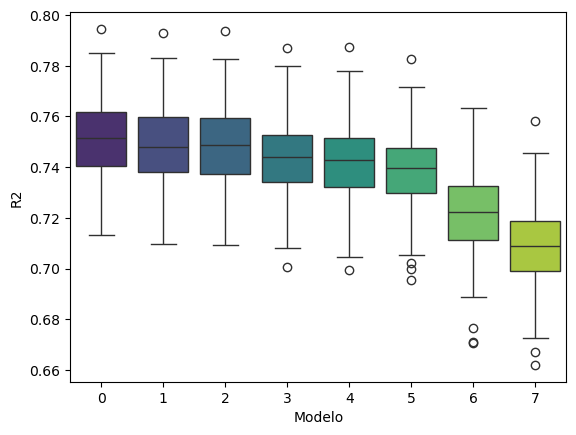

In [62]:
plt.clf()
# Boxplot paralelo para comparar
sns.boxplot(x='Modelo',y='R2',data=results,palette='viridis')
plt.show()

El tecer modelo parece el mejor en términos de simplicidad y capacidad preditiva, a partir de éste la capacidad baja

## Transformación de variables

In [63]:
# Aplicar a las variables continuas la mejor transfromación según correlacion frente a varObjCont
transf_cor = imput.drop(['bedrooms','sqft_lot','bedrooms_cat',
                              'sqft_above','prop_missings','aleatorio','aleatorio2'],axis=1).select_dtypes(include=np.number).apply(lambda x: mejorTransf(x,varObjCont_log, tipo='cor'))
# Pedir los nombres de las transromadas
transf_cor_names = imput.drop(['bedrooms','sqft_lot','bedrooms_cat',
                              'sqft_above','prop_missings','aleatorio','aleatorio2'],axis=1).select_dtypes(include=np.number).apply(lambda x: mejorTransf(x,varObjCont_log,tipo='cor', name=True))
# Asignar nombres a las columnas de salida del proceso
transf_cor.columns = transf_cor_names.values
transf_cor.head()

,month_sqr,bathrooms_sqr,sqft_living_ident,yr_built_cuarta,lat_raiz4,long_exp,bedrooms_cont_raiz4,log_sqft_lot_sqr
0,3.698455,8.305234,1.888732,56.045727,1.334036,33.256359,1.089009,10.477025
1,2.568425,2.990022,1.411019,0.089726,1.383623,3.604217,0.984040,9.433497
2,8.321234,16.277935,3.721816,179.350109,1.046429,55.933870,1.170212,17.648037
3,12.430329,16.277935,2.099815,153.998779,1.369617,2.789057,1.089009,5.250396
4,8.321234,5.315442,1.866513,17.734082,1.436695,3.528024,1.089009,7.214678


In [64]:
# Generar el archivo total con variables originales y transformaciones 
# Input con transfromadas según correlación
imput_transf_cor = imput.drop(['bedrooms','sqft_lot','bedrooms_cat',
                              'sqft_above','prop_missings','aleatorio','aleatorio2'],axis=1).join(transf_cor)
data_transf = imput_transf_cor.join(varObjCont_log)
data_transf.columns

Index(['month', 'bathrooms', 'sqft_living', 'yr_built', 'lat', 'long',
       'bedrooms_cont', 'log_sqft_lot', 'year', 'floors', 'waterfront', 'view',
       'condition', 'basement', 'yr_renovated', 'lat_rec', 'month_sqr',
       'bathrooms_sqr', 'sqft_living_ident', 'yr_built_cuarta', 'lat_raiz4',
       'long_exp', 'bedrooms_cont_raiz4', 'log_sqft_lot_sqr', 'log_price'],
      dtype='object')

# Selección automática de variables

In [65]:
# Aplicar a fórmula de modelo completo
form=ols_formula(data_transf,'log_price')
form

# Generar las matrices de diseño según la fórmula de modelo completo
y, X_transf = patsy.dmatrices(form, data_transf, return_type='dataframe')

In [66]:
!pip install mlxtend

In [67]:
# Probar los métodos clásicos de selección de variables que, partiendo del modelo completo/nulo eliminarán/añadirán secuencialmente variables hasta un número indicado o bien hasta alcanzar el mejor score

from sklearn.linear_model import LinearRegression
from mlxtend.feature_selection import SequentialFeatureSelector as sfs

clf = LinearRegression()

# Build step forward feature selection
sfs_back = sfs(clf,k_features = 'best',forward=False,floating=False, scoring='r2',cv=5,n_jobs=-1)

# Perform SFFS
sfs_back = sfs_back.fit(X_transf, y)

#print(sfs1.subsets_)

print(sfs_back.k_feature_names_)

sfs_back.k_score_

('year[T.2015]', 'floors[T.1.5]', 'waterfront[T.1]', 'view[T.1]', 'condition[T.B]', 'condition[T.CD]', 'condition[T.Desc]', 'basement[T.1]', 'yr_renovated[T.1]', 'lat_rec[T.[47.51, inf)]', 'month', 'bathrooms', 'sqft_living', 'yr_built', 'long', 'month_sqr', 'bathrooms_sqr', 'yr_built_cuarta', 'lat_raiz4', 'long_exp', 'log_sqft_lot_sqr')


0.7567904090582395

In [ ]:
#pd.DataFrame.from_dict(sfs_back.get_metric_dict()).T

### Visualización del proceso de selección de variables

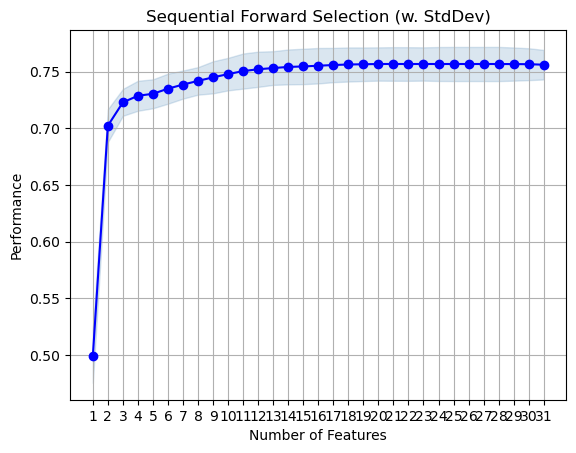

In [68]:
# Ver el gráfico
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs
import matplotlib.pyplot as plt

fig1 = plot_sfs(sfs_back.get_metric_dict(), kind='std_dev')

#plt.ylim([0.8, 1])
plt.title('Sequential Forward Selection (w. StdDev)')
plt.grid()
plt.show()

In [69]:
# SFS (selección secuencial de características) selección secuencial hacia atrás
sfs_forw = sfs(clf, 
          k_features='parsimonious', 
          forward=True, 
          floating=False, 
          scoring='r2',
          cv=5,n_jobs=-1)

sfs_forw = sfs_forw.fit(X_transf, y)

print('\nSequential Backward Selection:')
print(sfs_forw.k_feature_names_)
print('CV Score:')
print(sfs_forw.k_score_)


Sequential Backward Selection:
('year[T.2015]', 'floors[T.1.5]', 'waterfront[T.1]', 'view[T.1]', 'condition[T.B]', 'basement[T.1]', 'yr_renovated[T.1]', 'lat_rec[T.[47.51, inf)]', 'bathrooms', 'sqft_living', 'yr_built', 'long', 'yr_built_cuarta', 'lat_raiz4', 'long_exp', 'log_sqft_lot_sqr')
CV Score:
0.7542122244031132


In [70]:
# Proceso forward
#pd.DataFrame.from_dict(sfs_forw.get_metric_dict()).T
data_transf.columns

Index(['month', 'bathrooms', 'sqft_living', 'yr_built', 'lat', 'long',
       'bedrooms_cont', 'log_sqft_lot', 'year', 'floors', 'waterfront', 'view',
       'condition', 'basement', 'yr_renovated', 'lat_rec', 'month_sqr',
       'bathrooms_sqr', 'sqft_living_ident', 'yr_built_cuarta', 'lat_raiz4',
       'long_exp', 'bedrooms_cont_raiz4', 'log_sqft_lot_sqr', 'log_price'],
      dtype='object')

## Selección de variables con interacciones

In [71]:
# Aplicar a fórmula de modelo completo
formR=ols_formula(data_transf,'log_price','lat','sqft_living_ident',
                              'yr_built_cuarta','long_exp',
                              'log_sqft_lot_sqr')

# Generar las matrices de diseño según la fórmula de modelo completo
y, X = patsy.dmatrices(formR, data_transf, return_type='dataframe')
X.head()

,Intercept,year[T.2015],floors[T.1.5],floors[T.2.0],floors[T.2.5],floors[T.3.0],floors[T.3.5],waterfront[T.1],view[T.1],condition[T.B],condition[T.CD],condition[T.Desc],basement[T.1],yr_renovated[T.1],"lat_rec[T.[47.51, inf)]",month,bathrooms,sqft_living,yr_built,long,bedrooms_cont,log_sqft_lot,month_sqr,bathrooms_sqr,lat_raiz4,bedrooms_cont_raiz4
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,7.0,2.5,2070.0,1980.0,-122.013,3.0,9.182077,3.698455,8.305234,1.334036,1.089009
1,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,6.0,1.5,1640.0,1916.0,-122.325,2.0,9.042871,2.568425,2.990022,1.383623,0.984040
2,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,10.0,3.5,3720.0,2007.0,-121.940,4.0,9.993406,8.321234,16.277935,1.046429,1.170212
3,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,12.0,3.5,2260.0,2003.0,-122.361,3.0,8.386471,12.430329,16.277935,1.369617,1.089009
4,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,10.0,2.0,2050.0,1960.0,-122.328,3.0,8.718566,8.321234,5.315442,1.436695,1.089009


In [72]:
# Crear interacciones de todas las variables
from sklearn.preprocessing import OneHotEncoder, PolynomialFeatures

# Crear términos de interacción (interacción de cada par de regresores + polinomio)
# Los términos de interacción deben crearse tanto en los conjuntos de datos de prueba como de entrenamiento
interaction = PolynomialFeatures(degree=2, include_bias=False, interaction_only=True)
interaction

# traning
# imput_inter = pd.DataFrame(interaction.fit_transform(imput_red), columns=interaction.get_feature_names_out(input_features=imput_red.columns))
X_inter = pd.DataFrame(interaction.fit_transform(X.drop('Intercept',axis=1)), columns=interaction.get_feature_names_out(input_features=X.drop('Intercept',axis=1).columns))
X_inter.shape

(5000, 325)

In [73]:
# Eliminar columnas constantes (interacciones sin sentido)
X_inter = X_inter.loc[:, X_inter.var() != 0.0]

X_inter['Intercept'] = X.Intercept

In [74]:
# Calcular el valor de vCramer de todos los efectos frente a la objetivo y filtrar aquellos con valores más elevados
# Aplicar la función al input completo contra la objetivo
tablaCramer = pd.DataFrame(X_inter.apply(lambda x: cramers_v(x,varObjCont_log)),columns=['VCramer'])
tablaCramer.sort_values(by='VCramer', ascending=False)

,VCramer
"lat_rec[T.[47.51, inf)] lat_raiz4",0.463529
"lat_rec[T.[47.51, inf)]",0.463529
"lat_rec[T.[47.51, inf)] long",0.463529
"lat_rec[T.[47.51, inf)] yr_built",0.463529
"lat_rec[T.[47.51, inf)] sqft_living",0.448806
sqft_living lat_raiz4,0.440882
sqft_living,0.407433
sqft_living long,0.406890
sqft_living bedrooms_cont_raiz4,0.400474
sqft_living yr_built,0.396568


In [75]:
# Se seleccionan valores mayores que 0.35  para considerar solo lo más relevante y aligerar el proceso de selección
selec = tablaCramer[tablaCramer.VCramer > 0.35].index.tolist()

selec

['view[T.1]',
 'lat_rec[T.[47.51, inf)]',
 'sqft_living',
 'floors[T.2.0] lat_rec[T.[47.51, inf)]',
 'view[T.1] lat_rec[T.[47.51, inf)]',
 'view[T.1] yr_built',
 'view[T.1] long',
 'lat_rec[T.[47.51, inf)] bathrooms',
 'lat_rec[T.[47.51, inf)] sqft_living',
 'lat_rec[T.[47.51, inf)] yr_built',
 'lat_rec[T.[47.51, inf)] long',
 'lat_rec[T.[47.51, inf)] lat_raiz4',
 'bathrooms sqft_living',
 'sqft_living yr_built',
 'sqft_living long',
 'sqft_living log_sqft_lot',
 'sqft_living lat_raiz4',
 'sqft_living bedrooms_cont_raiz4']

In [76]:
# Selección de interacciones 
datasel = X_inter[selec]
datasel.head()

,view[T.1],"lat_rec[T.[47.51, inf)]",sqft_living,"floors[T.2.0] lat_rec[T.[47.51, inf)]","view[T.1] lat_rec[T.[47.51, inf)]",view[T.1] yr_built,view[T.1] long,"lat_rec[T.[47.51, inf)] bathrooms","lat_rec[T.[47.51, inf)] sqft_living","lat_rec[T.[47.51, inf)] yr_built","lat_rec[T.[47.51, inf)] long","lat_rec[T.[47.51, inf)] lat_raiz4",bathrooms sqft_living,sqft_living yr_built,sqft_living long,sqft_living log_sqft_lot,sqft_living lat_raiz4,sqft_living bedrooms_cont_raiz4
0,0.0,1.0,2070.0,0.0,0.0,0.0,-0.00,2.5,2070.0,1980.0,-122.013,1.334036,5175.0,4098600.0,-252566.91,19006.899568,2761.454576,2254.249610
1,0.0,1.0,1640.0,0.0,0.0,0.0,-0.00,1.5,1640.0,1916.0,-122.325,1.383623,2460.0,3142240.0,-200613.00,14830.309037,2269.141959,1613.825416
2,1.0,0.0,3720.0,0.0,0.0,2007.0,-121.94,0.0,0.0,0.0,-0.000,0.000000,13020.0,7466040.0,-453616.80,37175.470528,3892.715064,4353.187283
3,0.0,1.0,2260.0,1.0,0.0,0.0,-0.00,3.5,2260.0,2003.0,-122.361,1.369617,7910.0,4526780.0,-276535.86,18953.424912,3095.334480,2461.161410
4,0.0,1.0,2050.0,0.0,0.0,0.0,-0.00,2.0,2050.0,1960.0,-122.328,1.436695,4100.0,4018000.0,-250772.40,17873.060248,2945.224152,2232.469420


In [77]:
# Juntar X con las interacciones buenas
datatot = pd.concat([X, datasel], axis=1)
datatot.shape

(5000, 44)

In [78]:
# Eliminar columnas duplicadas
datatot = datatot.T.drop_duplicates().T
datatot.shape

(5000, 41)

In [79]:
# Ya se tiene el archivo con variables originales, transfromaciones de continuas y las interacciones que parecen más relevantes
# Sequential Forward Selection
sfs_back_int_par = sfs(clf, 
          k_features='parsimonious', 
          forward=False, 
          floating=False, 
          scoring='r2',
          cv=4,n_jobs=-1)

sfs_back_int_par = sfs_back_int_par.fit(datatot, y)

print('\nSequential Backward Selection:')
print(sfs_back_int_par.k_feature_names_)
print('CV Score:')
print(sfs_back_int_par.k_score_)


Sequential Backward Selection:
('waterfront[T.1]', 'view[T.1] long', 'lat_rec[T.[47.51, inf)] yr_built', 'lat_rec[T.[47.51, inf)] long', 'sqft_living long')
CV Score:
0.7333116158561501


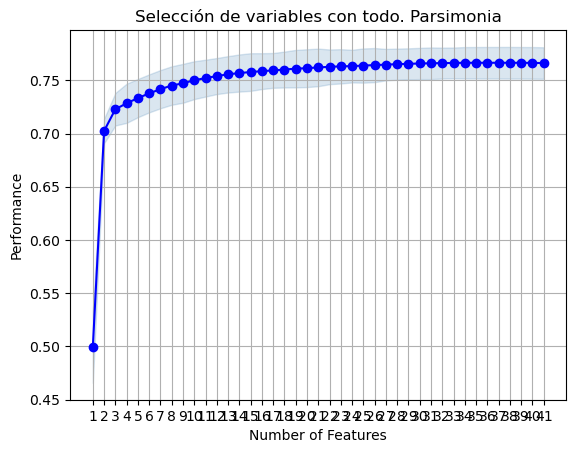

In [80]:
# Ver el gráfico 
fig1 = plot_sfs(sfs_back_int_par.get_metric_dict(), kind='std_dev')

#plt.ylim([0.8, 1])
plt.title('Selección de variables con todo. Parsimonia')
plt.grid()
plt.show()

In [81]:
# Sequential Forward Selection
sfs_forw_int_tot = sfs(clf, 
          k_features='best', 
          forward=True, 
          floating=False, 
          scoring='r2',
          cv=4,n_jobs=-1)

sfs_forw_int_tot = sfs_forw_int_tot.fit(datatot, y)

print('\nSequential Backward Selection:')
print(sfs_forw_int_tot.k_feature_names_)
print('CV Score:')
print(sfs_forw_int_tot.k_score_)

# Parece que los valores de r2 mejoran en torno a una centésima pero el modelo es muy complejo


Sequential Backward Selection:
('year[T.2015]', 'floors[T.1.5]', 'floors[T.2.0]', 'floors[T.2.5]', 'floors[T.3.0]', 'waterfront[T.1]', 'view[T.1]', 'condition[T.B]', 'condition[T.CD]', 'condition[T.Desc]', 'basement[T.1]', 'yr_renovated[T.1]', 'lat_rec[T.[47.51, inf)]', 'month', 'bathrooms', 'sqft_living', 'yr_built', 'long', 'bedrooms_cont', 'log_sqft_lot', 'month_sqr', 'bathrooms_sqr', 'lat_raiz4', 'floors[T.2.0] lat_rec[T.[47.51, inf)]', 'view[T.1] lat_rec[T.[47.51, inf)]', 'view[T.1] long', 'lat_rec[T.[47.51, inf)] sqft_living', 'lat_rec[T.[47.51, inf)] yr_built', 'lat_rec[T.[47.51, inf)] long', 'lat_rec[T.[47.51, inf)] lat_raiz4', 'bathrooms sqft_living', 'sqft_living yr_built', 'sqft_living long', 'sqft_living log_sqft_lot', 'sqft_living lat_raiz4', 'sqft_living bedrooms_cont_raiz4')
CV Score:
0.7664908837197831


## Selección de variables por LASSO

In [82]:
from sklearn import linear_model

reg = linear_model.LassoLarsIC(criterion='bic')

reg.fit(X_transf, y)

print(reg.coef_)

[ 0.00000000e+00  8.77345373e-02  3.54916384e-02  2.56358774e-02
  1.02464104e-01  6.86117204e-02  0.00000000e+00  4.21706520e-01
  2.14914948e-01 -1.08946703e-01 -3.50562390e-02 -2.56907108e-01
 -3.29887755e-02  7.54865879e-02  4.22714610e-01  2.81321887e-02
  9.07579533e-02  3.27388798e-04 -3.31327994e-03 -3.36571132e-01
 -1.15945130e-01  5.48018077e-03  3.71976176e-02 -2.23322868e-02
 -7.09328553e-03  0.00000000e+00  1.43515408e-03  7.38578283e-01
 -4.24772144e-04 -1.93598088e-01  1.93496437e-03]


In [83]:
selec_feats = X_transf[X_transf.columns[(reg.coef_ != 0).ravel().tolist()]]
selec_feats.columns.tolist()

['year[T.2015]',
 'floors[T.1.5]',
 'floors[T.2.0]',
 'floors[T.2.5]',
 'floors[T.3.0]',
 'waterfront[T.1]',
 'view[T.1]',
 'condition[T.B]',
 'condition[T.CD]',
 'condition[T.Desc]',
 'basement[T.1]',
 'yr_renovated[T.1]',
 'lat_rec[T.[47.51, inf)]',
 'month',
 'bathrooms',
 'sqft_living',
 'yr_built',
 'lat',
 'long',
 'bedrooms_cont',
 'log_sqft_lot',
 'month_sqr',
 'bathrooms_sqr',
 'yr_built_cuarta',
 'lat_raiz4',
 'long_exp',
 'bedrooms_cont_raiz4',
 'log_sqft_lot_sqr']

In [84]:
# Lasso con interacciones
lasso_int = linear_model.LassoLarsIC(criterion='bic')

lasso_int.fit(X_inter, y)

print(lasso_int.coef_)

[ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -1.83669614e-02  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  1.58865912e-05
  2.58524168e-05  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00 -2.12418413e-05  3.84772536e-05
  0.00000000e+00  0.00000

In [85]:
selec_feats_int = X_inter[X_inter.columns[(lasso_int.coef_ != 0).ravel().tolist()]]
selec_feats_int.columns.tolist()

['sqft_living',
 'year[T.2015] sqft_living',
 'year[T.2015] yr_built',
 'floors[T.1.5] sqft_living',
 'floors[T.1.5] yr_built',
 'floors[T.2.0] sqft_living',
 'floors[T.2.0] yr_built',
 'floors[T.2.0] bedrooms_cont',
 'floors[T.2.5] sqft_living',
 'floors[T.2.5] yr_built',
 'floors[T.3.0] sqft_living',
 'floors[T.3.0] yr_built',
 'floors[T.3.5] sqft_living',
 'waterfront[T.1] sqft_living',
 'waterfront[T.1] yr_built',
 'view[T.1] sqft_living',
 'view[T.1] yr_built',
 'condition[T.B] sqft_living',
 'condition[T.B] yr_built',
 'condition[T.B] long',
 'condition[T.CD] month',
 'condition[T.CD] sqft_living',
 'condition[T.Desc] sqft_living',
 'condition[T.Desc] yr_built',
 'basement[T.1] sqft_living',
 'basement[T.1] yr_built',
 'basement[T.1] bathrooms_sqr',
 'yr_renovated[T.1] sqft_living',
 'yr_renovated[T.1] yr_built',
 'yr_renovated[T.1] bathrooms_sqr',
 'lat_rec[T.[47.51, inf)] sqft_living',
 'lat_rec[T.[47.51, inf)] yr_built',
 'lat_rec[T.[47.51, inf)] long',
 'lat_rec[T.[47.51, inf

## Comparación por validación cruzada

In [86]:
import seaborn as sns
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold
from sklearn.linear_model import LinearRegression

model =LinearRegression()

# Función para comparación por validación cruzada
def cross_val (sfs, data, y, seed=12345):
        X = sfs
        if not isinstance(sfs,pd.DataFrame):
            X = sfs.transform(data)
        # Establecemos esquema de validación fijando random_state (reproducibilidad)
        cv = RepeatedKFold(n_splits=5, n_repeats=20, random_state=seed)
        # Obtenemos los resultados de R2 para cada partición tr-tst
        scores = cross_val_score(model, X, y, cv=cv)
        # Sesgo y varianza
        print('Coeficiente de determinación R2: %.3f (%.3f)' % (np.mean(scores), np.std(scores)))
       # sns.violinplot(y=scores,palette='viridis')
        return(scores)

In [87]:
list_sfs = [sfs_back,sfs_forw,sfs_back_int_par,sfs_forw_int_tot,selec_feats,selec_feats_int]
#list_sfs

#data = imput_dummy.join(imput_inter,lsuffix="_left")

# Aplicamos a toda la lista la función creada (devuelve un dataframe pero está transpuesto)
list_res = pd.DataFrame(map(lambda x: cross_val(x,datatot,y, seed=2022),list_sfs))

# Trasnponer dataframe y pasar de wide a long (creando un factor variable con el nombre de cada fórmula de la lista[0,1,2,3])
results_lasso = list_res.T.melt()
results_lasso.columns = ['Modelo','R2']
results_lasso.head()

Coeficiente de determinación R2: 0.747 (0.014)
Coeficiente de determinación R2: 0.742 (0.014)
Coeficiente de determinación R2: 0.735 (0.015)
Coeficiente de determinación R2: 0.767 (0.014)
Coeficiente de determinación R2: 0.757 (0.014)
Coeficiente de determinación R2: 0.772 (0.013)


,Modelo,R2
0,0,0.729941
1,0,0.769080
2,0,0.744648
3,0,0.733521
4,0,0.756552


<Axes: xlabel='Modelo', ylabel='R2'>

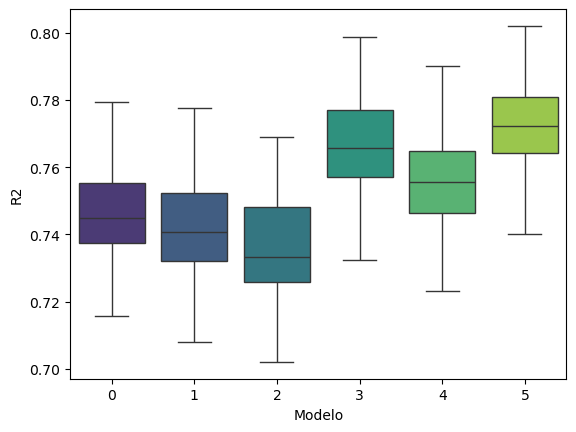

In [88]:
# Boxplot paralelo para comparar
sns.boxplot(x='Modelo',y='R2',data=results_lasso,palette='viridis')

# Elección del modelo final

**Modelo Lasso**

En este caso el objeto selec_feats creado en la etapa Lasso es, en realidad una matriz de diseño explícita pero sin constante. Se debe añadir la constante a este dataset de preditores y ajustaremos modelo por OLS

In [89]:
# X = pd.DataFrame(sfs_forw_int_tot.transform(datatot))
# X.columns = sfs_forw_int_tot.k_feature_names_
# Añadir constante
selec_feats_int=sm.add_constant(selec_feats_int)

mod_sv = sm.OLS(y,selec_feats_int).fit()
mod_sv.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              log_price   R-squared:                       0.782
Model:                            OLS   Adj. R-squared:                  0.779
Method:                 Least Squares   F-statistic:                     272.0
Date:                Fri, 06 Dec 2024   Prob (F-statistic):               0.00
Time:                        19:05:50   Log-Likelihood:                -92.955
No. Observations:                5000   AIC:                             317.9
Df Residuals:                    4934   BIC:                             748.0
Df Model:                          65                                         
Covariance Type:            nonrobust                                         
========================================================================================================
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------
const                                   23.9663      3.025      7.924      0.000      18.037      29.896
sqft_living                             -0.0222      0.003     -7.013      0.000      -0.028      -0.016
year[T.2015] sqft_living              1.399e-05   1.67e-05      0.840      0.401   -1.87e-05    4.67e-05
year[T.2015] yr_built                 2.725e-05    1.9e-05      1.436      0.151   -9.95e-06    6.45e-05
floors[T.1.5] sqft_living            -2.416e-05   1.97e-05     -1.224      0.221   -6.28e-05    1.45e-05
floors[T.1.5] yr_built                3.503e-05   2.05e-05      1.712      0.087   -5.08e-06    7.51e-05
floors[T.2.0] sqft_living            -9.457e-06   1.37e-05     -0.693      0.489   -3.62e-05    1.73e-05
floors[T.2.0] yr_built                9.437e-06    1.7e-05      0.555      0.579   -2.39e-05    4.27e-05
floors[T.2.0] bedrooms_cont              0.0062      0.004      1.599      0.110      -0.001       0.014
floors[T.2.5] sqft_living             2.449e-05   3.83e-05      0.639      0.523   -5.06e-05    9.96e-05
floors[T.2.5] yr_built               -1.161e-05   6.09e-05     -0.191      0.849      -0.000       0.000
floors[T.3.0] sqft_living             -4.88e-05   3.07e-05     -1.589      0.112      -0.000    1.14e-05
floors[T.3.0] yr_built                   0.0001   3.21e-05      3.130      0.002    3.75e-05       0.000
floors[T.3.5] sqft_living              2.79e-05   4.16e-05      0.671      0.502   -5.36e-05       0.000
waterfront[T.1] sqft_living          -1.689e-05   3.18e-05     -0.531      0.595   -7.92e-05    4.54e-05
waterfront[T.1] yr_built                 0.0003   5.26e-05      4.980      0.000       0.000       0.000
view[T.1] sqft_living                -3.242e-05   1.32e-05     -2.453      0.014   -5.83e-05   -6.51e-06
view[T.1] yr_built                       0.0001   1.89e-05      7.784      0.000       0.000       0.000
condition[T.B] sqft_living           -3.224e-05   1.31e-05     -2.457      0.014    -5.8e-05   -6.51e-06
condition[T.B] yr_built                  0.0012      0.000      3.626      0.000       0.001       0.002
condition[T.B] long                      0.0191      0.005      3.702      0.000       0.009       0.029
condition[T.CD] month                    0.0030      0.002      1.227      0.220      -0.002       0.008
condition[T.CD] sqft_living          -2.361e-05   9.81e-06     -2.408      0.016   -4.28e-05   -4.39e-06
condition[T.Desc] sqft_living         3.438e-05    6.8e-05      0.506      0.613   -9.89e-05       0.000
condition[T.Desc] yr_built              -0.0001   5.13e-05     -2.274      0.023      -0.000   -1.61e-05
basement[T.1] sqft_living            -9.291e-05   1.33e-05     -6.984      0.000      -0.000   -6.68e-05
basement[T.1] yr_built                

Importancia de las variables

In [90]:
# Nombres de predictores (en modo dummy) donde quitamos la constante
names=selec_feats_int.columns.tolist()[1:]

# Calcular importancia relativa
df_results = relativeImp(selec_feats_int.join(y), outcomeName = 'log_price', driverNames = names)

# Ordenar valores 
df_results.sort_values(by='normRelaImpt', ascending=False)

,driver,rawRelaImpt,normRelaImpt
32,"lat_rec[T.[47.51, inf)] long",0.051685,6.610806
31,"lat_rec[T.[47.51, inf)] yr_built",0.051246,6.554562
33,"lat_rec[T.[47.51, inf)] log_sqft_lot",0.049161,6.287936
30,"lat_rec[T.[47.51, inf)] sqft_living",0.046480,5.944955
58,yr_built lat_raiz4,0.042076,5.381740
51,sqft_living lat_raiz4,0.033948,4.342105
46,sqft_living long,0.032107,4.106672
0,sqft_living,0.032071,4.101983
45,sqft_living yr_built,0.031712,4.056121
48,sqft_living log_sqft_lot,0.029313,3.749293


**Interacciones más relevantes en Lasso** 

- Lat_rec * Long 
- Lat_rec * Year built
- Lat_rec * log_sqft_lot
- Lat_raiz4 con varias variables

**Modelo por selección de variables secuencial**

Ver el summary del modelo complejo por SFS. Para ello, transformar datos por el selector de variables y añadir los nombre al df para que salgan en el modelo. Luego un OLS puesto que se tiene matrices explícitas

In [91]:
sfs = pd.DataFrame(sfs_forw_int_tot.transform(datatot))
sfs.columns = sfs_forw_int_tot.k_feature_names_

# Añadir constante
sfs=sm.add_constant(sfs)

mod_sv = sm.OLS(y,sfs).fit()
mod_sv.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              log_price   R-squared:                       0.772
Model:                            OLS   Adj. R-squared:                  0.771
Method:                 Least Squares   F-statistic:                     467.5
Date:                Fri, 06 Dec 2024   Prob (F-statistic):               0.00
Time:                        19:06:51   Log-Likelihood:                -200.34
No. Observations:                5000   AIC:                             474.7
Df Residuals:                    4963   BIC:                             715.8
Df Model:                          36                                         
Covariance Type:            nonrobust                                         
=========================================================================================================
                                            coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------
const                                    74.2014     10.501      7.066      0.000      53.616      94.787
year[T.2015]                              0.0868      0.015      5.834      0.000       0.058       0.116
floors[T.1.5]                             0.0471      0.014      3.327      0.001       0.019       0.075
floors[T.2.0]                            -0.0152      0.019     -0.809      0.418      -0.052       0.022
floors[T.2.5]                             0.1319      0.043      3.043      0.002       0.047       0.217
floors[T.3.0]                             0.1429      0.027      5.216      0.000       0.089       0.197
waterfront[T.1]                           0.4475      0.042     10.586      0.000       0.365       0.530
view[T.1]                               -32.3484     10.997     -2.942      0.003     -53.906     -10.790
condition[T.B]                           -0.0890      0.014     -6.174      0.000      -0.117      -0.061
condition[T.CD]                          -0.0308      0.015     -2.117      0.034      -0.059      -0.002
condition[T.Desc]                        -0.2265      0.042     -5.335      0.000      -0.310      -0.143
basement[T.1]                            -0.0553      0.010     -5.772      0.000      -0.074      -0.036
yr_renovated[T.1]                         0.0605      0.019      3.123      0.002       0.023       0.098
lat_rec[T.[47.51, inf)]                 -79.8262      7.983    -10.000      0.000     -95.476     -64.176
month                                     0.0253      0.006      3.986      0.000       0.013       0.038
bathrooms                                 0.0577      0.015      3.798      0.000       0.028       0.087
sqft_living                              -0.0171      0.005     -3.757      0.000      -0.026      -0.008
yr_built                                  0.0015      0.000      2.998      0.003       0.001       0.002
long                                      0.5495      0.083      6.590      0.000       0.386       0.713
bedrooms_cont                             0.0134      0.003      4.002      0.000       0.007       0.020
log_sqft_lot                              0.0563      0.013      4.290      0.000       0.031       0.082
month_sqr                                -0.0205      0.004     -4.706      0.000      -0.029      -0.012
bathrooms_sqr                             0.0089      0.003      2.628      0.009       0.002       0.016
lat_raiz4                                 1.1153      0.127      8.753      0.000       0.865       1.365
floors[T.2.0] lat_rec[T.[47.51, inf)]     0.0895      0.021      4.216      0.000       0.048       0.131
view[T.1] lat_rec[T.[47.51, inf)]        -0.0995      0.031     -3.199      0.001      -0.160      -0.039
view[T.1]

Valorar importancia de los efectos

In [92]:
# Nombres de predictores (en modo dummy) donde quitamos la constante
names=X.columns.tolist()[1:]

# Calcular importancia relativa
df_results = relativeImp(X.join(y), outcomeName = 'log_price', driverNames = names)

# Ordenar valores 
df_results.sort_values(by='normRelaImpt', ascending=False)

,driver,rawRelaImpt,normRelaImpt
16,sqft_living,0.197257,26.096689
13,"lat_rec[T.[47.51, inf)]",0.139543,18.461285
23,lat_raiz4,0.091966,12.166868
22,bathrooms_sqr,0.074411,9.844366
15,bathrooms,0.067606,8.944084
7,view[T.1],0.048056,6.357676
2,floors[T.2.0],0.031176,4.124572
20,log_sqft_lot,0.020711,2.740009
24,bedrooms_cont_raiz4,0.018955,2.507689
6,waterfront[T.1],0.013180,1.743663


**Interacciones más relevantes en Lasso** 

- Sqft_living con varias, lat long yr_built...

## Ajuste de modelo en datos completos

In [93]:
# El modelo manual mejor era el de *form2*. Se va a ajustar este a los datos completos
# Ajustar regresión sin prop_missings
modeloF1 = ols(form2,data=data_transf).fit()
modeloF1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              log_price   R-squared:                       0.750
Model:                            OLS   Adj. R-squared:                  0.749
Method:                 Least Squares   F-statistic:                     828.7
Date:                Fri, 06 Dec 2024   Prob (F-statistic):               0.00
Time:                        19:07:19   Log-Likelihood:                -436.74
No. Observations:                5000   AIC:                             911.5
Df Residuals:                    4981   BIC:                             1035.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
===========================================================================================
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Intercept                  -9.1985      4.180     -2.201      0.028     -17.392      -1.005
year[T.2015]                0.0605      0.008      7.496      0.000       0.045       0.076
floors[T.1.5]               0.0664      0.014      4.593      0.000       0.038       0.095
floors[T.2.0]               0.0809      0.011      7.435      0.000       0.060       0.102
floors[T.2.5]               0.1799      0.045      4.036      0.000       0.093       0.267
floors[T.3.0]               0.1579      0.026      6.131      0.000       0.107       0.208
floors[T.3.5]               0.2203      0.267      0.827      0.408      -0.302       0.743
waterfront[T.1]             0.4356      0.043     10.105      0.000       0.351       0.520
view[T.1]                   0.1971      0.014     14.181      0.000       0.170       0.224
condition[T.B]             -0.0948      0.015     -6.375      0.000      -0.124      -0.066
condition[T.CD]            -0.0431      0.015     -2.840      0.005      -0.073      -0.013
condition[T.Desc]          -0.2466      0.044     -5.592      0.000      -0.333      -0.160
yr_renovated[T.1]           0.0699      0.020      3.513      0.000       0.031       0.109
lat_rec[T.[47.51, inf)]     0.5109      0.009     58.084      0.000       0.494       0.528
bathrooms                   0.0487      0.006      7.551      0.000       0.036       0.061
sqft_living                 0.0003   6.75e-06     46.752      0.000       0.000       0.000
yr_built                   -0.0008      0.000     -3.669      0.000      -0.001      -0.000
long                       -0.1823      0.033     -5.561      0.000      -0.247      -0.118
log_sqft_lot                0.0404      0.006      6.835      0.000       0.029       0.052
==============================================================================
Omnibus:                      116.464   Durbin-Watson:                   2.034
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              259.172
Skew:                          -0.064   Prob(JB):                     5.27e-57
Kurtosis:                       4.108   Cond. No.                     3.29e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.29e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [94]:
form2_r = form2 + '+ lat_rec:long + lat_rec:yr_built '
# Ajustar regresión sin prop_missings
modeloF2 = ols(form2_r,data=data_transf).fit()
modeloF2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              log_price   R-squared:                       0.758
Model:                            OLS   Adj. R-squared:                  0.757
Method:                 Least Squares   F-statistic:                     778.2
Date:                Fri, 06 Dec 2024   Prob (F-statistic):               0.00
Time:                        19:07:24   Log-Likelihood:                -355.89
No. Observations:                5000   AIC:                             753.8
Df Residuals:                    4979   BIC:                             890.6
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
====================================================================================================
                                       coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------
Intercept                           33.9963      6.415      5.299      0.000      21.419      46.573
year[T.2015]                         0.0617      0.008      7.769      0.000       0.046       0.077
floors[T.1.5]                        0.0580      0.014      4.072      0.000       0.030       0.086
floors[T.2.0]                        0.0765      0.011      7.123      0.000       0.055       0.097
floors[T.2.5]                        0.1480      0.044      3.368      0.001       0.062       0.234
floors[T.3.0]                        0.1505      0.026      5.857      0.000       0.100       0.201
floors[T.3.5]                        0.1919      0.262      0.732      0.464      -0.322       0.706
waterfront[T.1]                      0.4852      0.043     11.388      0.000       0.402       0.569
view[T.1]                            0.1913      0.014     13.963      0.000       0.164       0.218
condition[T.B]                      -0.0899      0.015     -6.127      0.000      -0.119      -0.061
condition[T.CD]                     -0.0348      0.015     -2.323      0.020      -0.064      -0.005
condition[T.Desc]                   -0.2333      0.043     -5.372      0.000      -0.318      -0.148
yr_renovated[T.1]                    0.0717      0.020      3.656      0.000       0.033       0.110
lat_rec[T.[47.51, inf)]            -69.0027      7.982     -8.645      0.000     -84.650     -53.355
bathrooms                            0.0465      0.006      7.318      0.000       0.034       0.059
sqft_living                          0.0003   6.65e-06     47.629      0.000       0.000       0.000
yr_built                             0.0009      0.000      2.598      0.009       0.000       0.002
lat_rec[T.[47.51, inf)]:yr_built    -0.0017      0.000     -5.090      0.000      -0.002      -0.001
long                                 0.1988      0.051      3.915      0.000       0.099       0.298
lat_rec[T.[47.51, inf)]:long        -0.5970      0.063     -9.431      0.000      -0.721      -0.473
log_sqft_lot                         0.0506      0.006      8.610      0.000       0.039       0.062
==============================================================================
Omnibus:                      138.121   Durbin-Watson:                   2.039
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              331.373
Skew:                          -0.080   Prob(JB):                     1.10e-72
Kurtosis:                       4.251   Cond. No.                     8.55e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 8.55e+06. This might indicate that there are
stron

In [95]:
form2_r2 = form2 + '+ lat_rec:long + lat_rec:yr_built + long*lat_raiz4 + sqft_living*bedrooms_cont_raiz4 + lat_rec:log_sqft_lot'
# Ajusto regresión sin prop_missings
modeloF3 = ols(form2_r2,data=data_transf).fit()
modeloF3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              log_price   R-squared:                       0.767
Model:                            OLS   Adj. R-squared:                  0.766
Method:                 Least Squares   F-statistic:                     656.5
Date:                Fri, 06 Dec 2024   Prob (F-statistic):               0.00
Time:                        19:07:29   Log-Likelihood:                -252.86
No. Observations:                5000   AIC:                             557.7
Df Residuals:                    4974   BIC:                             727.2
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
========================================================================================================
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------
Intercept                              201.2534     36.400      5.529      0.000     129.894     272.613
year[T.2015]                             0.0613      0.008      7.884      0.000       0.046       0.077
floors[T.1.5]                            0.0512      0.014      3.624      0.000       0.023       0.079
floors[T.2.0]                            0.0712      0.011      6.747      0.000       0.051       0.092
floors[T.2.5]                            0.1217      0.043      2.810      0.005       0.037       0.207
floors[T.3.0]                            0.0995      0.026      3.894      0.000       0.049       0.150
floors[T.3.5]                            0.3476      0.260      1.335      0.182      -0.163       0.858
waterfront[T.1]                          0.4528      0.042     10.814      0.000       0.371       0.535
view[T.1]                                0.1978      0.014     14.648      0.000       0.171       0.224
condition[T.B]                          -0.0956      0.014     -6.640      0.000      -0.124      -0.067
condition[T.CD]                         -0.0346      0.015     -2.357      0.018      -0.063      -0.006
condition[T.Desc]                       -0.2148      0.043     -5.033      0.000      -0.299      -0.131
yr_renovated[T.1]                        0.0721      0.019      3.747      0.000       0.034       0.110
lat_rec[T.[47.51, inf)]                -10.9519     11.248     -0.974      0.330     -33.002      11.098
bathrooms                                0.0457      0.006      7.293      0.000       0.033       0.058
sqft_living                              0.0005   4.52e-05     11.006      0.000       0.000       0.001
yr_built                                 0.0017      0.000      4.986      0.000       0.001       0.002
lat_rec[T.[47.51, inf)]:yr_built        -0.0027      0.000     -7.929      0.000      -0.003      -0.002
long                                     1.5920      0.299      5.332      0.000       1.007       2.177
lat_rec[T.[47.51, inf)]:long            -0.1442      0.090     -1.606      0.108      -0.320       0.032
log_sqft_lot                             0.1069      0.009     12.029      0.000       0.089       0.124
lat_rec[T.[47.51, inf)]:log_sqft_lot    -0.0950      0.011     -8.732      0.000      -0.116      -0.074
lat_raiz4                             -154.9516     32.316     -4.795      0.000    -218.305     -91.598
long:lat_raiz4                          -1.2726      0.265     -4.810      0.000      -1.791      -0.754
bedrooms_cont_raiz4                      0.1654      0.081      2.035      0.042       0.006       0.325
sqft_living:bedrooms_cont_raiz4         -0.0001   3.85e-05     -3.821      0.000      -0.000   -7.17e-05
======================================

Comparar estos por cv

In [96]:
# Crear lista de fórmulas   
list_form = [form2,form2_r,form2_r2]
#list_form

# Aplicar a toda la lista la función creada (devuelve un dataframe pero está transpuesto)
list_res = pd.DataFrame(map(lambda x: cross_val_lin(x,data_transf, seed=2022),list_form))

# Trasnponer dataframe y pasar de wide a long (creando un factor variable con el nombre de cada fórmula de la lista[0,1,2,3])
results = list_res.T.melt()
results.columns = ['Modelo','R2']
results.head()

Modelo: log_price ~ bathrooms + sqft_living + yr_built + long + log_sqft_lot + year + floors + waterfront + view + condition + yr_renovated + lat_rec
Coeficiente de determinación R2: 0.747 (0.014)
Modelo: log_price ~ bathrooms + sqft_living + yr_built + long + log_sqft_lot + year + floors + waterfront + view + condition + yr_renovated + lat_rec+ lat_rec:long + lat_rec:yr_built 
Coeficiente de determinación R2: 0.754 (0.014)
Modelo: log_price ~ bathrooms + sqft_living + yr_built + long + log_sqft_lot + year + floors + waterfront + view + condition + yr_renovated + lat_rec+ lat_rec:long + lat_rec:yr_built + long*lat_raiz4 + sqft_living*bedrooms_cont_raiz4 + lat_rec:log_sqft_lot
Coeficiente de determinación R2: 0.764 (0.014)


,Modelo,R2
0,0,0.731951
1,0,0.760565
2,0,0.746016
3,0,0.738448
4,0,0.754355


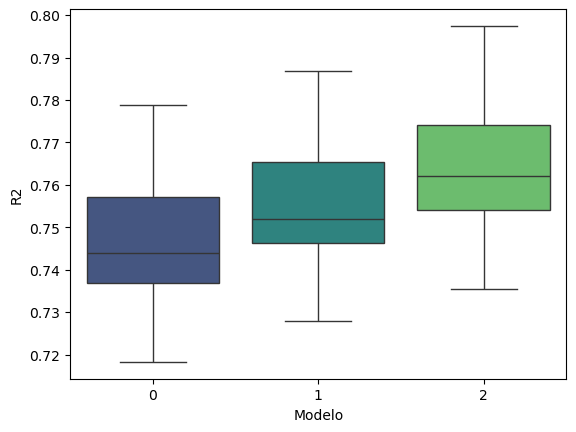

In [97]:
plt.clf()
# Boxplot paralelo para comparar
sns.boxplot(x='Modelo',y='R2',data=results,palette='viridis')
plt.show()

Se elige el modelo intermedio con un par de efectos de iteracción sobre lat_rec ya que el último es demasiado complejo

## Interpretación de parámetros

Teniendo en cuenta que se trata de un modelo con respuesta logarítmica, lo que en el ámbito de la economía especialmente se conoce como modelo log-nivel, es habitual la interpretación de los efectos de los estimadores como la variación en % de la respuesta. Es decir, el aumento de una unidad de la variable continua produce un aumento del 100xbetaCont % de la variable respuesta y la pertenencia a una categoría concreta incrementa en un 100xbetaCat % el valor de la respueta respecto a la categoría de referencia. 

De esta forma se tiene:

- Un aumento unitario de la variable *bathrooms* se traduce en un aumento del 0.65% del precio estimado de la vivienda.  

- Un aumento unitario de *sqft_living* provoca un aumento del precio de 0.03% 

- Tener vistas al mar, *waterfront=1*, aumenta el valor de la vivienda en un 48,52% y tener buenas vistas *view=1* lo hace en un 19,13%. 

- Que la casa haya sido renovada alguna vez, *yr_renovated=1*, se traduce en un aumento del 7,17% del valor de la vivienda.

- El año de construcción contiene interacción con lat_rec, por tanto: 

      + En lat_rec de referencia: el aumento unitario de **yr_built** provoca un aumento del 0.09% en el precio.
      + En lat_rec >47.51: el aumento unitario de  **yr_built** provoca 0.0009-0.0017 = -0.0008 --> disminución del 0,08% del precio!!

Se invierte el sentido de influencia según el barrio y ceteris paribus. De esta forma se podría luchar la interpretación de un modelo con interacciones. 